In [ ]:
from google.colab import drive
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import itertools
from statsmodels.tsa.seasonal import seasonal_decompose
from statsmodels.tsa.stattools import adfuller
from statsmodels.tsa.arima.model import ARIMA
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
import matplotlib.cm as cm
import matplotlib.colors as mcolors
import warnings
warnings.filterwarnings("ignore")
from sklearn.metrics import mean_squared_error, mean_absolute_percentage_error, r2_score, mean_absolute_error
from sklearn.preprocessing import MinMaxScaler
from itertools import product
from typing import Union
from tqdm import tqdm_notebook
from sklearn.model_selection import train_test_split
from sklearn.model_selection import TimeSeriesSplit
from statsmodels.tsa.statespace.sarimax import SARIMAX
from tqdm.notebook import tqdm
from tqdm.notebook import tqdm_notebook
import torch
import torch.nn as nn
import torch.optim as optim

In [ ]:
# drive.mount('/content/drive')
df = pd.read_csv('//content/Tetuan City power consumption.csv')
df.head()


,DateTime,Temperature,Humidity,Wind Speed,general diffuse flows,diffuse flows,Zone 1 Power Consumption,Zone 2 Power Consumption,Zone 3 Power Consumption
0,1/1/2017 0:00,6.559,73.8,0.083,0.051,0.119,34055.69620,16128.87538,20240.96386
1,1/1/2017 0:10,6.414,74.5,0.083,0.070,0.085,29814.68354,19375.07599,20131.08434
2,1/1/2017 0:20,6.313,74.5,0.080,0.062,0.100,29128.10127,19006.68693,19668.43373
3,1/1/2017 0:30,6.121,75.0,0.083,0.091,0.096,28228.86076,18361.09422,18899.27711
4,1/1/2017 0:40,5.921,75.7,0.081,0.048,0.085,27335.69620,17872.34043,18442.40964


In [ ]:
df.tail()

,DateTime,Temperature,Humidity,Wind Speed,general diffuse flows,diffuse flows,Zone 1 Power Consumption,Zone 2 Power Consumption,Zone 3 Power Consumption
52411,12/30/2017 23:10,7.010,72.4,0.080,0.040,0.096,31160.45627,26857.31820,14780.31212
52412,12/30/2017 23:20,6.947,72.6,0.082,0.051,0.093,30430.41825,26124.57809,14428.81152
52413,12/30/2017 23:30,6.900,72.8,0.086,0.084,0.074,29590.87452,25277.69254,13806.48259
52414,12/30/2017 23:40,6.758,73.0,0.080,0.066,0.089,28958.17490,24692.23688,13512.60504
52415,12/30/2017 23:50,6.580,74.1,0.081,0.062,0.111,28349.80989,24055.23167,13345.49820


### Parsing the Datetime column

In [ ]:
df['DateTime'] = df['DateTime'].astype(str)
df['DateTime'] = pd.to_datetime(df['DateTime'], format='%m/%d/%Y %H:%M', errors='coerce')
print(df['DateTime'].head())

0   2017-01-01 00:00:00
1   2017-01-01 00:10:00
2   2017-01-01 00:20:00
3   2017-01-01 00:30:00
4   2017-01-01 00:40:00
Name: DateTime, dtype: datetime64[ns]


In [ ]:
df = df[df['DateTime'].notna()]
df.set_index('DateTime', inplace=True)
df.sort_index(inplace=True)


In [ ]:
print(df.index.min(), df.index.max())


2017-01-01 00:00:00 2017-12-30 23:50:00


In [ ]:
df.tail()

,Temperature,Humidity,Wind Speed,general diffuse flows,diffuse flows,Zone 1 Power Consumption,Zone 2 Power Consumption,Zone 3 Power Consumption
DateTime,,,,,,,,
2017-12-30 23:10:00,7.010,72.4,0.080,0.040,0.096,31160.45627,26857.31820,14780.31212
2017-12-30 23:20:00,6.947,72.6,0.082,0.051,0.093,30430.41825,26124.57809,14428.81152
2017-12-30 23:30:00,6.900,72.8,0.086,0.084,0.074,29590.87452,25277.69254,13806.48259
2017-12-30 23:40:00,6.758,73.0,0.080,0.066,0.089,28958.17490,24692.23688,13512.60504
2017-12-30 23:50:00,6.580,74.1,0.081,0.062,0.111,28349.80989,24055.23167,13345.49820


In [ ]:
Hourly_avg_zone1 = df["Zone 1 Power Consumption"].resample('H').sum()
Hourly_avg_zone2 = df["Zone 2  Power Consumption"].resample('H').sum()
Hourly_avg_zone3 = df["Zone 3  Power Consumption"].resample('H').sum()


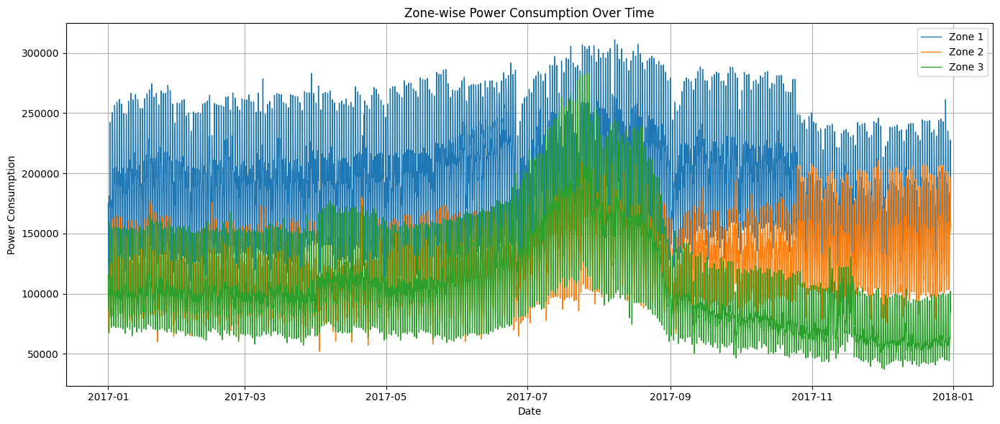

In [ ]:
plt.figure(figsize=(14, 6))

plt.plot(Hourly_avg_zone1.index, Hourly_avg_zone1, label='Zone 1', linewidth=1)
plt.plot(Hourly_avg_zone2.index, Hourly_avg_zone2, label='Zone 2', linewidth=1)
plt.plot(Hourly_avg_zone3.index, Hourly_avg_zone3, label='Zone 3', linewidth=1)

plt.xlabel('Date')
plt.ylabel('Power Consumption')
plt.title('Zone-wise Power Consumption Over Time')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

# Weather condition

In [ ]:
df.columns = df.columns.str.strip()
Hourly_temp_stats = df['Temperature'].resample('H').agg(['min', 'max', 'mean'])

In [ ]:
hourly_wind_stats = df.resample('H')['Wind Speed'].agg(['mean'])

In [ ]:
Hourly_humidity = df['Humidity'].resample('H').agg(['mean', 'min', 'max'])
Hourly_humidity

,mean,min,max
DateTime,,,
2017-01-01 00:00:00,75.066667,73.80,76.90
2017-01-01 01:00:00,77.583333,76.70,78.20
2017-01-01 02:00:00,78.933333,78.50,79.70
2017-01-01 03:00:00,77.083333,76.20,77.90
2017-01-01 04:00:00,74.050000,71.90,75.70
...,...,...,...
2017-12-30 19:00:00,62.406667,61.15,63.35
2017-12-30 20:00:00,63.990000,63.38,64.75
2017-12-30 21:00:00,69.675000,65.49,71.70


In [ ]:
Hourly_df = df['diffuse flows'].resample('H').agg(['mean', 'min', 'max'])
Hourly_df

,mean,min,max
DateTime,,,
2017-01-01 00:00:00,0.098833,0.085,0.119
2017-01-01 01:00:00,0.112500,0.093,0.141
2017-01-01 02:00:00,0.129167,0.096,0.163
2017-01-01 03:00:00,0.141000,0.108,0.185
2017-01-01 04:00:00,0.122833,0.096,0.148
...,...,...,...
2017-12-30 19:00:00,0.102000,0.089,0.119
2017-12-30 20:00:00,0.105000,0.085,0.145
2017-12-30 21:00:00,0.098333,0.078,0.134


In [ ]:
Hourly_gdf = df['general diffuse flows'].resample('H').agg(['mean', 'min', 'max'])
Hourly_gdf


,mean,min,max
DateTime,,,
2017-01-01 00:00:00,0.063500,0.048,0.091
2017-01-01 01:00:00,0.056833,0.048,0.066
2017-01-01 02:00:00,0.063000,0.051,0.070
2017-01-01 03:00:00,0.059833,0.051,0.070
2017-01-01 04:00:00,0.058000,0.037,0.073
...,...,...,...
2017-12-30 19:00:00,0.052000,0.037,0.062
2017-12-30 20:00:00,0.052667,0.022,0.073
2017-12-30 21:00:00,0.073167,0.062,0.088


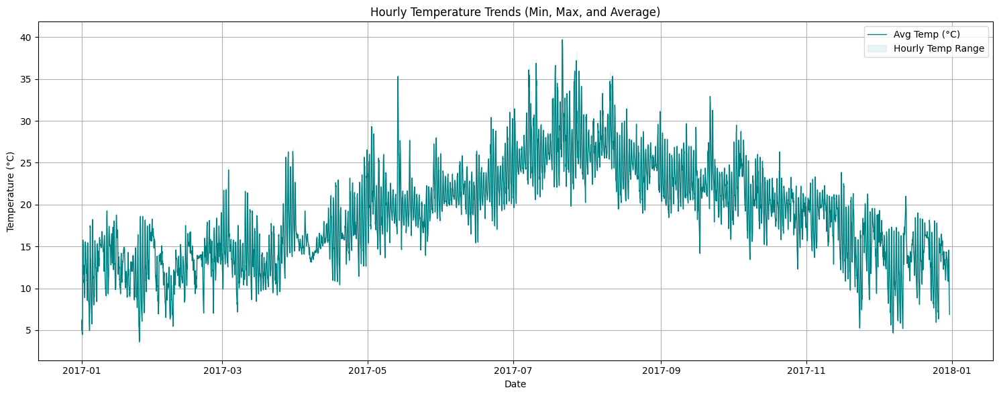

In [ ]:
plt.figure(figsize=(15, 6))
plt.plot(Hourly_temp_stats.index, Hourly_temp_stats['mean'], label='Avg Temp (°C)', color='teal', linewidth=1)

plt.fill_between(Hourly_temp_stats.index, Hourly_temp_stats['min'], Hourly_temp_stats['max'],
                 color='lightblue', alpha=0.3, label='Hourly Temp Range')

plt.title('Hourly Temperature Trends (aAverage)')
plt.xlabel('Date')
plt.ylabel('Temperature (°C)')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

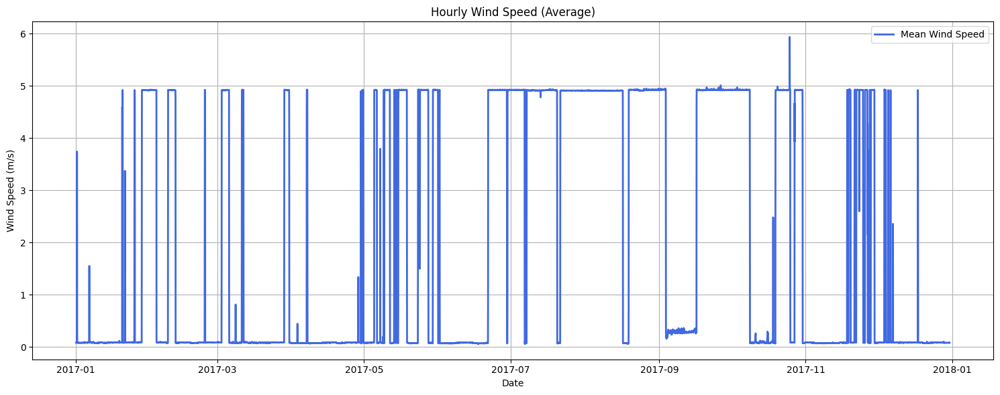

In [ ]:
plt.figure(figsize=(15, 6))
plt.plot(hourly_wind_stats.index, hourly_wind_stats['mean'], label='Mean Wind Speed', color='royalblue', linewidth=2)
plt.title('Hourly Wind Speed (Average)')
plt.xlabel('Date')
plt.ylabel('Wind Speed (m/s)')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

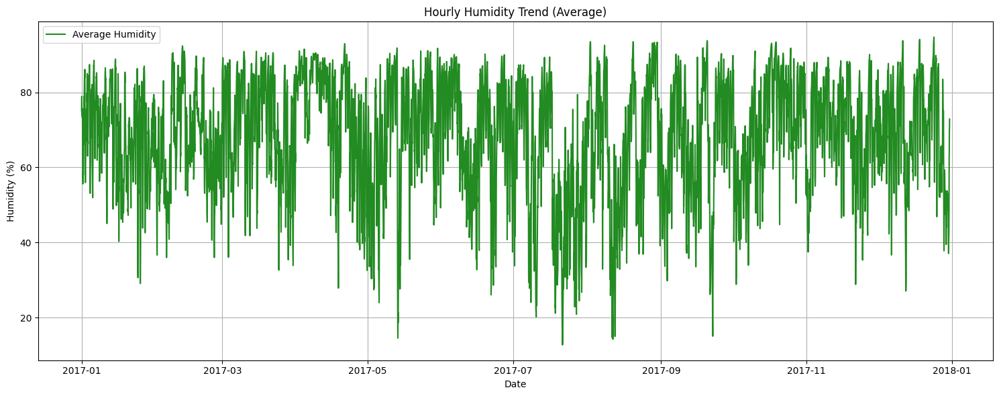

In [ ]:
plt.figure(figsize=(15, 6))
plt.plot(Hourly_humidity.index, Hourly_humidity['mean'], label='Average Humidity', color='forestgreen')

plt.title('Hourly Humidity Trend (Average)')
plt.xlabel('Date')
plt.ylabel('Humidity (%)')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


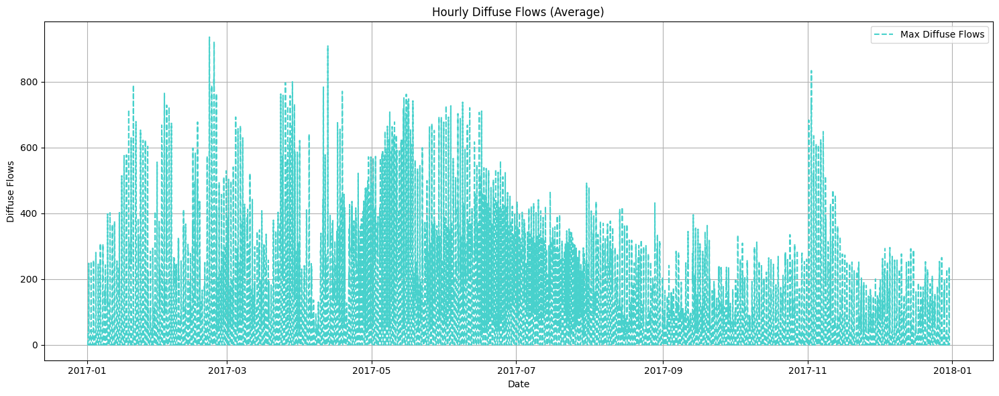

In [ ]:
plt.figure(figsize=(15, 6))
plt.plot(Hourly_df.index, Hourly_df['max'], label='Max Diffuse Flows', color='mediumturquoise', linestyle='--')

plt.title('Hourly Diffuse Flows (Average)')
plt.xlabel('Date')
plt.ylabel('Diffuse Flows')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


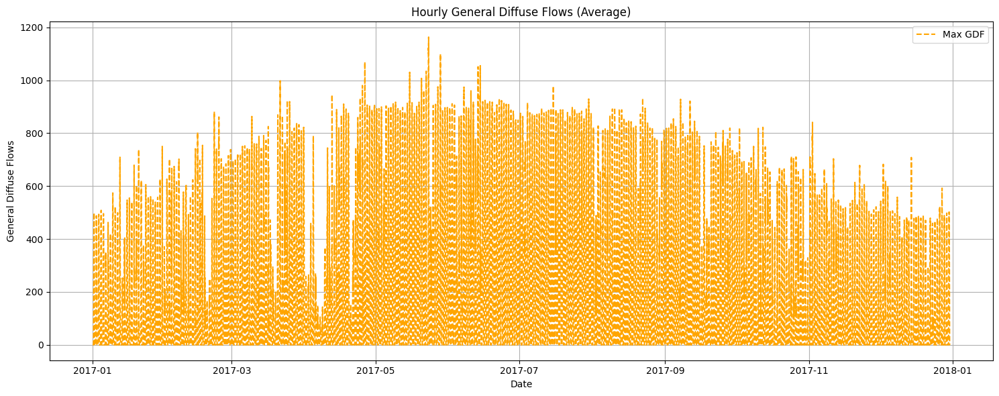

In [ ]:
plt.figure(figsize=(15, 6))
plt.plot(Hourly_gdf.index, Hourly_gdf['max'], label='Max GDF', color='orange', linestyle='--')

plt.title('Hourly General Diffuse Flows (Average)')
plt.xlabel('Date')
plt.ylabel('General Diffuse Flows')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

# EDA

<Figure size 2000x2000 with 0 Axes>

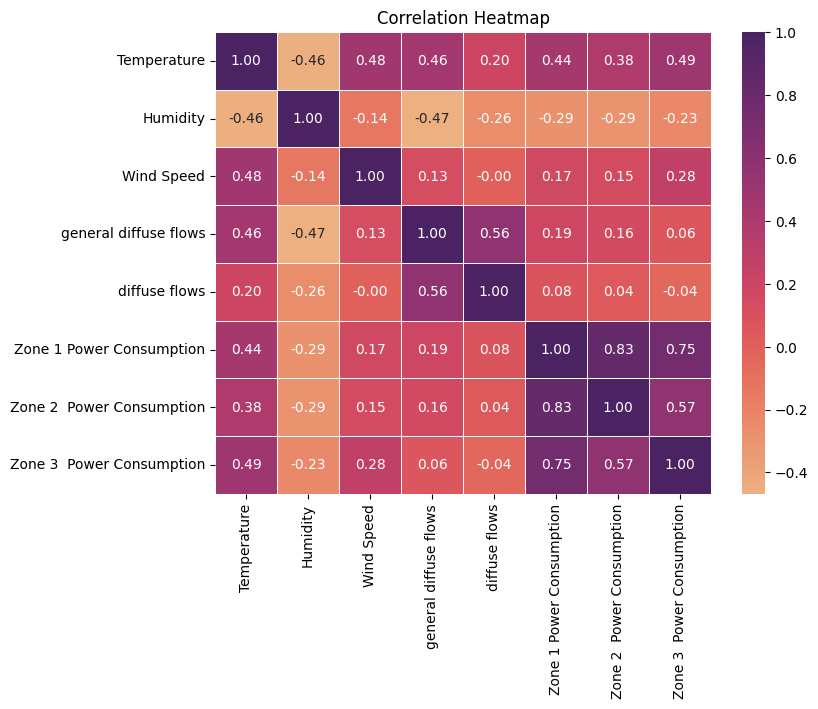

In [ ]:
plt.figure(figsize=(20,20))
corr_matrix = df.select_dtypes(include=['float64', 'int64', 'int32']).corr()

plt.figure(figsize=(8, 6))
sns.heatmap(corr_matrix, annot=True, cmap='flare', fmt='.2f', linewidths=0.5)
plt.title('Correlation Heatmap')
plt.show()


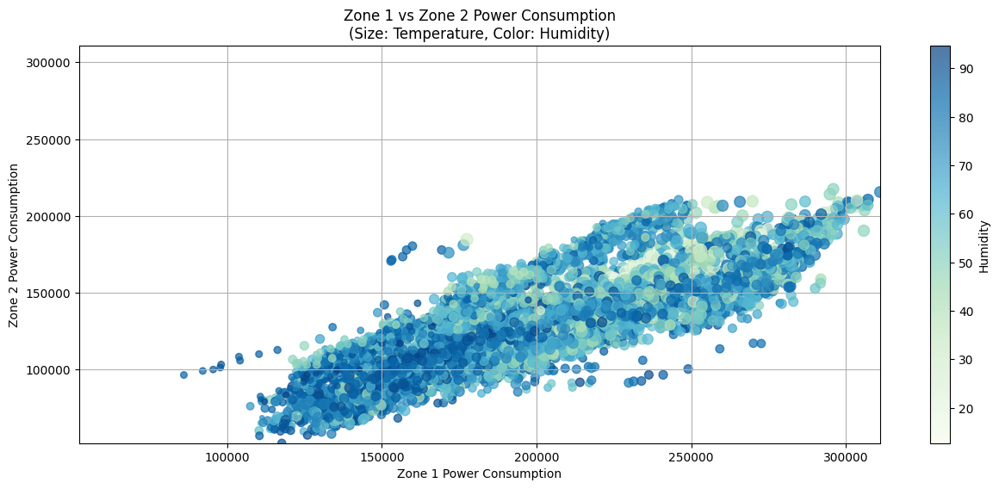

In [ ]:
min_val = min(Hourly_avg_zone1.min(), Hourly_avg_zone2.min())
max_val = max(Hourly_avg_zone1.max(), Hourly_avg_zone2.max())

plt.figure(figsize=(15, 6))

scatter = plt.scatter(
    Hourly_avg_zone1.values,                     # X: Zone 1
    Hourly_avg_zone2.values,                     # Y: Zone 2
    c= Hourly_humidity['mean'],            # Color: Humidity
    s=3 * Hourly_temp_stats['mean'],     # Size: Temperature
    cmap='GnBu',
    alpha=0.7
)

plt.xlabel('Zone 1 Power Consumption')
plt.ylabel('Zone 2 Power Consumption')
plt.title('Zone 1 vs Zone 2 Power Consumption\n(Size: Temperature, Color: Humidity)')

plt.xlim(min_val, max_val)
plt.ylim(min_val, max_val)

# Add colorbar for humidity
cbar = plt.colorbar(scatter)
cbar.set_label('Humidity')

plt.grid(True)
plt.show()


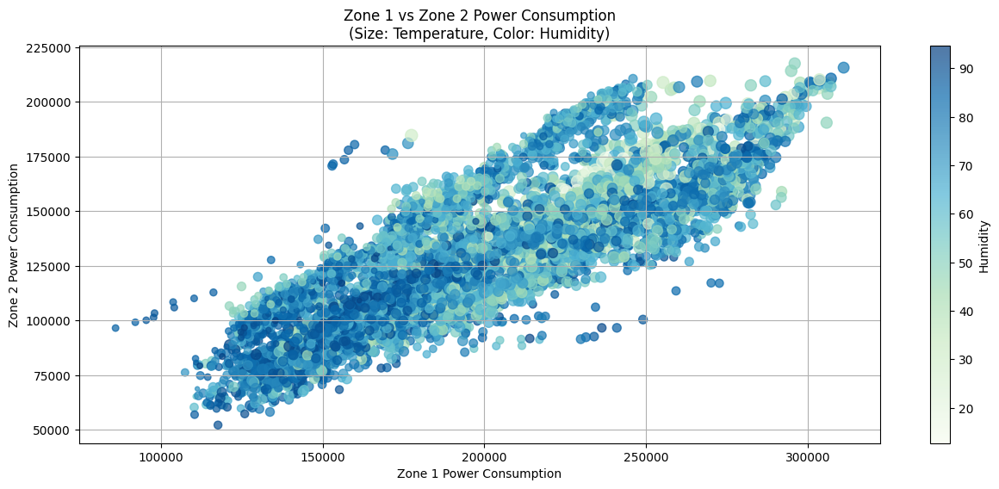

In [ ]:
plt.figure(figsize=(15, 6))

scatter = plt.scatter(
    Hourly_avg_zone1.values,                     # X: Zone 1
    Hourly_avg_zone2.values,                     # Y: Zone 2
    c= Hourly_humidity['mean'],            # Color: Humidity
    s=3 * Hourly_temp_stats['mean'],         # Size: Temperature
    cmap='GnBu',                             # Flare-style colormap
    alpha=0.7
)

plt.xlabel('Zone 1 Power Consumption')
plt.ylabel('Zone 2 Power Consumption')
plt.title('Zone 1 vs Zone 2 Power Consumption\n(Size: Temperature, Color: Humidity)')

# Add colorbar for humidity
cbar = plt.colorbar(scatter)
cbar.set_label('Humidity')

plt.grid(True)
plt.show()

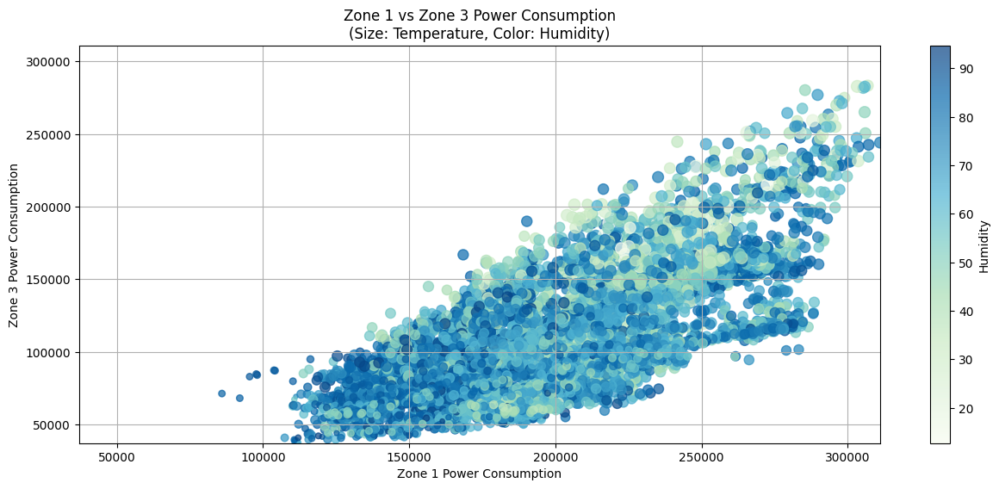

In [ ]:
# Calculate shared min and max
min_val = min(Hourly_avg_zone1.min(), Hourly_avg_zone3.min())
max_val = max(Hourly_avg_zone1.max(), Hourly_avg_zone3.max())

plt.figure(figsize=(15, 6))

scatter = plt.scatter(
    Hourly_avg_zone1.values,
    Hourly_avg_zone3.values,
    c= Hourly_humidity['mean'],            # Color: Humidity
    s=3 * Hourly_temp_stats['mean'],
    cmap='GnBu',
    alpha=0.7
)

plt.xlabel('Zone 1 Power Consumption')
plt.ylabel('Zone 3 Power Consumption')
plt.title('Zone 1 vs Zone 3 Power Consumption\n(Size: Temperature, Color: Humidity)')

# Set equal axis ranges
plt.xlim(min_val, max_val)
plt.ylim(min_val, max_val)

# Colorbar for humidity
cbar = plt.colorbar(scatter)
cbar.set_label('Humidity')

plt.grid(True)
plt.show()


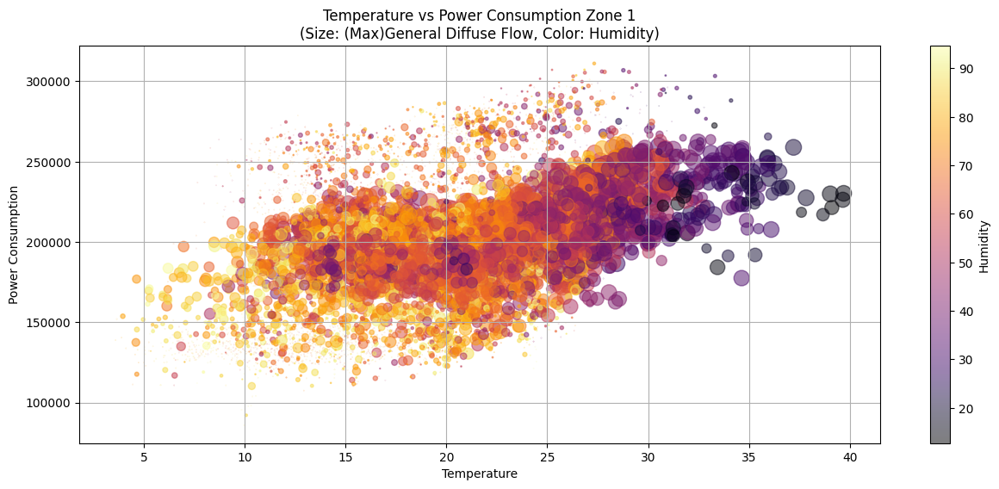

In [ ]:
norm = mcolors.Normalize(vmin=Hourly_humidity['mean'].min(), vmax= Hourly_humidity['mean'].max())

plt.figure(figsize=(15, 6))

scatter = plt.scatter(
    Hourly_temp_stats['mean'],
    Hourly_avg_zone1.values,
    s=0.2 * Hourly_gdf['max'],
    c= Hourly_humidity['mean'],
    cmap='inferno',
    label = 'Zone 1',
    alpha=0.5
)

plt.xlabel('Temperature')
plt.ylabel('Power Consumption')
plt.title('Temperature vs Power Consumption Zone 1\n(Size: (Max)General Diffuse Flow, Color: Humidity)')

cbar = plt.colorbar(scatter)
cbar.set_label('Humidity')

plt.grid(True)
plt.show()

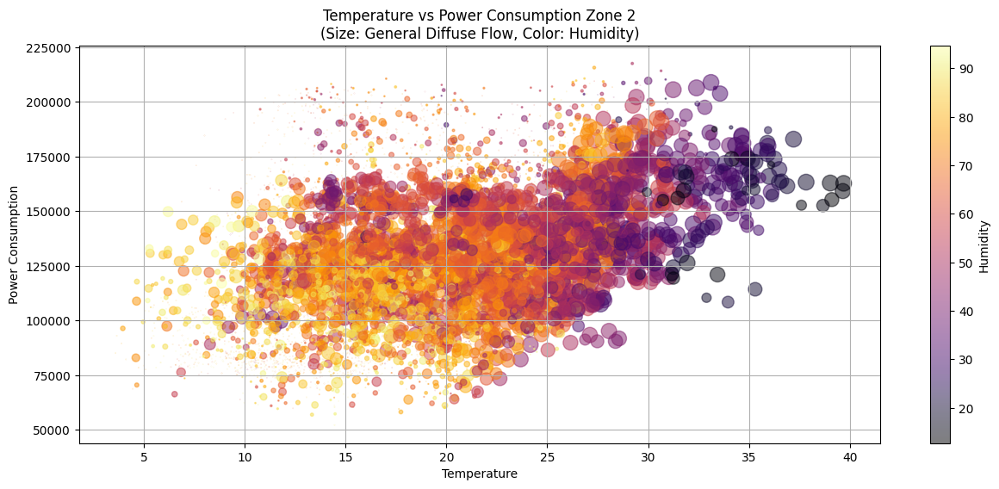

In [ ]:
plt.figure(figsize=(15, 6))

scatter = plt.scatter(
    Hourly_temp_stats['mean'],
    Hourly_avg_zone2.values,
    s=0.2 * Hourly_gdf['max'],
    c=Hourly_humidity['mean'],
    label= 'Zone 2',
    cmap='inferno',
    alpha=0.5
)

plt.xlabel('Temperature')
plt.ylabel('Power Consumption')
plt.title('Temperature vs Power Consumption Zone 2\n(Size: General Diffuse Flow, Color: Humidity)')

cbar = plt.colorbar(scatter)
cbar.set_label('Humidity')

plt.grid(True)
plt.show()

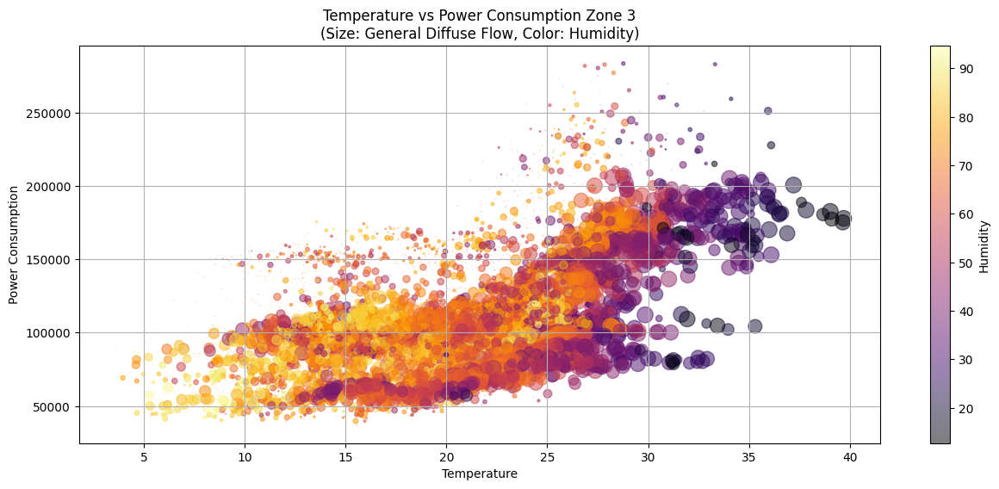

In [ ]:
plt.figure(figsize=(15, 6))
scatter = plt.scatter(
    Hourly_temp_stats['mean'],
    Hourly_avg_zone3.values,
    s=0.2 * Hourly_gdf['max'],
    c= Hourly_humidity['mean'],
    cmap='inferno',
    label = 'Zone 3',
    alpha=0.5
)

plt.xlabel('Temperature')
plt.ylabel('Power Consumption')
plt.title('Temperature vs Power Consumption Zone 3\n(Size: General Diffuse Flow, Color: Humidity)')
cbar = plt.colorbar(scatter)
cbar.set_label('Humidity')

plt.grid(True)
plt.show()

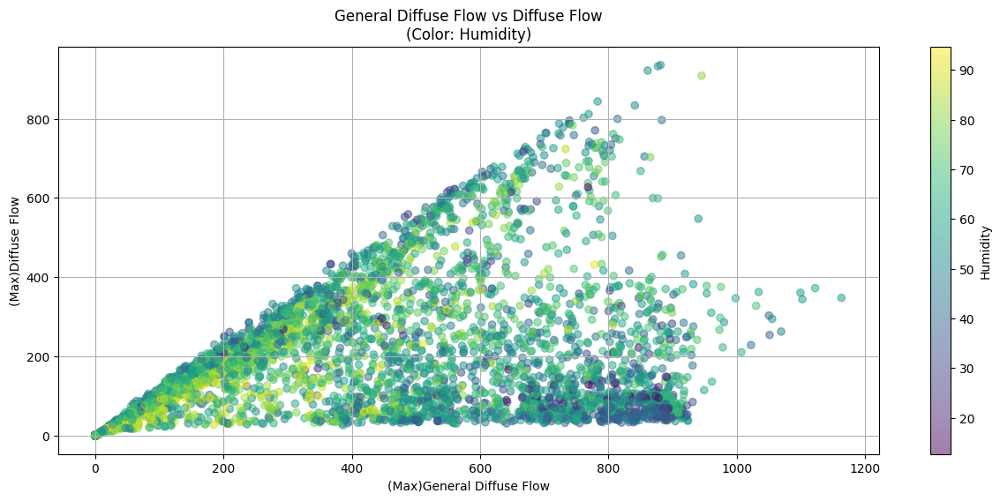

In [ ]:
plt.figure(figsize=(15, 6))

scatter = plt.scatter(
    Hourly_gdf['max'],
    Hourly_df['max'],
    c=Hourly_humidity['mean'],
    cmap='viridis',
    alpha=0.5
)

plt.xlabel('(Max)General Diffuse Flow')
plt.ylabel('(Max)Diffuse Flow')
plt.title('General Diffuse Flow vs Diffuse Flow\n(Color: Humidity)')

cbar = plt.colorbar(scatter)
cbar.set_label('Humidity')

plt.grid(True)
plt.show()

In [ ]:
df['DateTime'] = pd.to_datetime(df['DateTime'])

# ✅ Filter for one month — e.g., January 2017
one_month_df = df[(df['DateTime'].dt.year == 2017) & (df['DateTime'].dt.month == 1)]

# ✅ Optional: Reset index
one_month_df = one_month_df.reset_index(drop=True)

# ✅ Preview result
print(one_month_df.head())

             DateTime  Temperature  Humidity  Wind Speed  \
0 2017-01-01 00:00:00        6.559      73.8       0.083   
1 2017-01-01 00:10:00        6.414      74.5       0.083   
2 2017-01-01 00:20:00        6.313      74.5       0.080   
3 2017-01-01 00:30:00        6.121      75.0       0.083   
4 2017-01-01 00:40:00        5.921      75.7       0.081   

   general diffuse flows  diffuse flows  Zone 1 Power Consumption  \
0                  0.051          0.119               34055.69620   
1                  0.070          0.085               29814.68354   
2                  0.062          0.100               29128.10127   
3                  0.091          0.096               28228.86076   
4                  0.048          0.085               27335.69620   

   Zone 2  Power Consumption  Zone 3  Power Consumption  
0                16128.87538                20240.96386  
1                19375.07599                20131.08434  
2                19006.68693                19668.

In [ ]:
df['DateTime'] = pd.to_datetime(df['DateTime'])
df.set_index('DateTime', inplace=True)

In [ ]:
# Function to decompose one month's data
def decompose_monthly_timeseries(df, target_column, month, period=24):
    monthly_series = df[df.index.month == month][target_column]

    if monthly_series.empty:
        print(f"No data found for month {month} in column '{target_column}'")
        return

    try:
        result = seasonal_decompose(monthly_series, model='additive', period=period)
        fig = result.plot()
        fig.set_size_inches(10, 6)
        plt.suptitle(f'Seasonal Decomposition of {target_column} - {monthly_series.index[0].strftime("%B")}', fontsize=16)
        plt.tight_layout()
        plt.show()
    except ValueError as e:
        print(f"Decomposition failed: {e}")


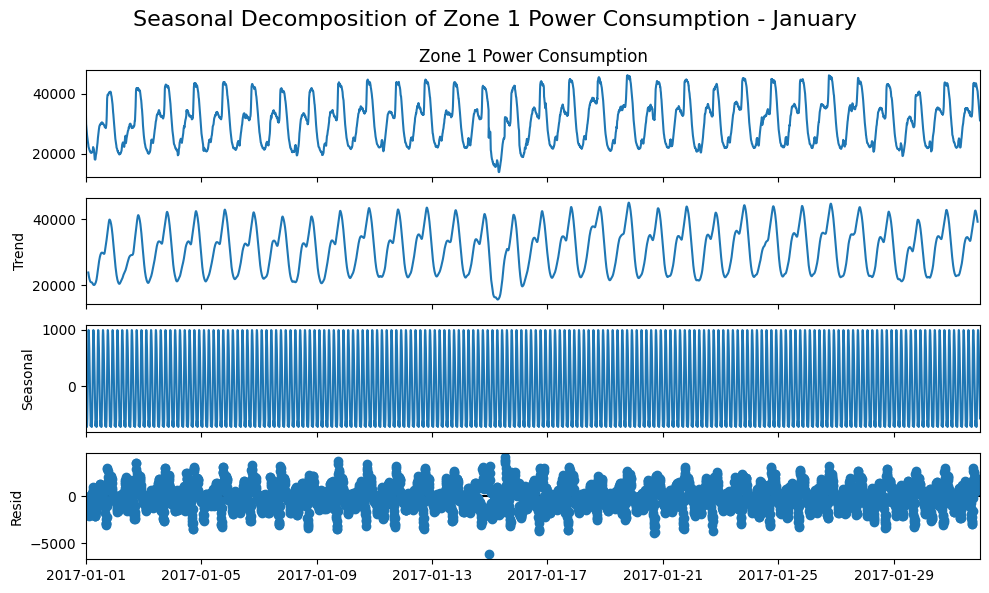

In [ ]:
decompose_monthly_timeseries(df, target_column='Zone 1 Power Consumption', month=1, period=24)


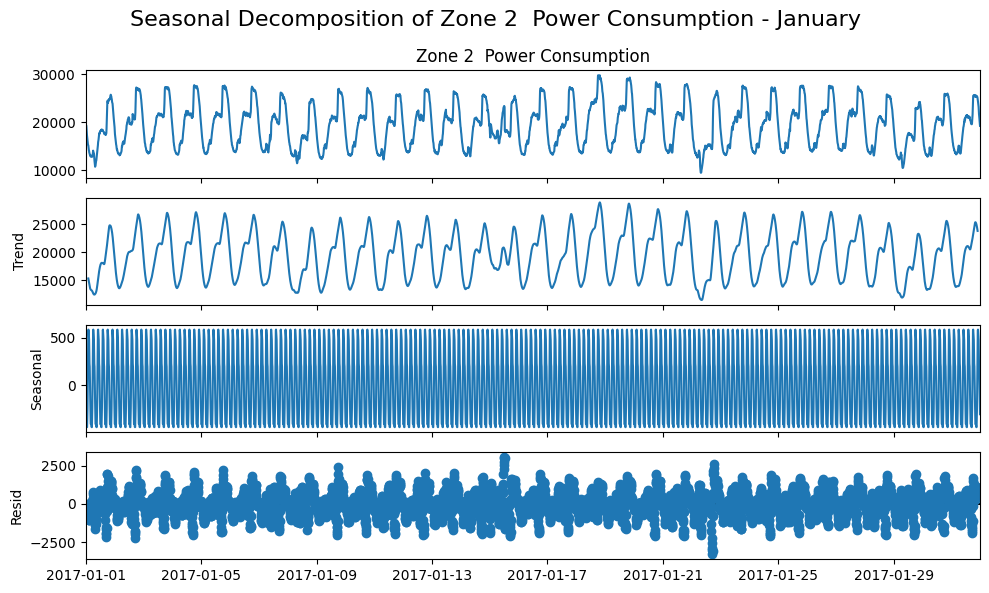

In [ ]:
decompose_monthly_timeseries(df, target_column='Zone 2  Power Consumption', month=1, period=24)


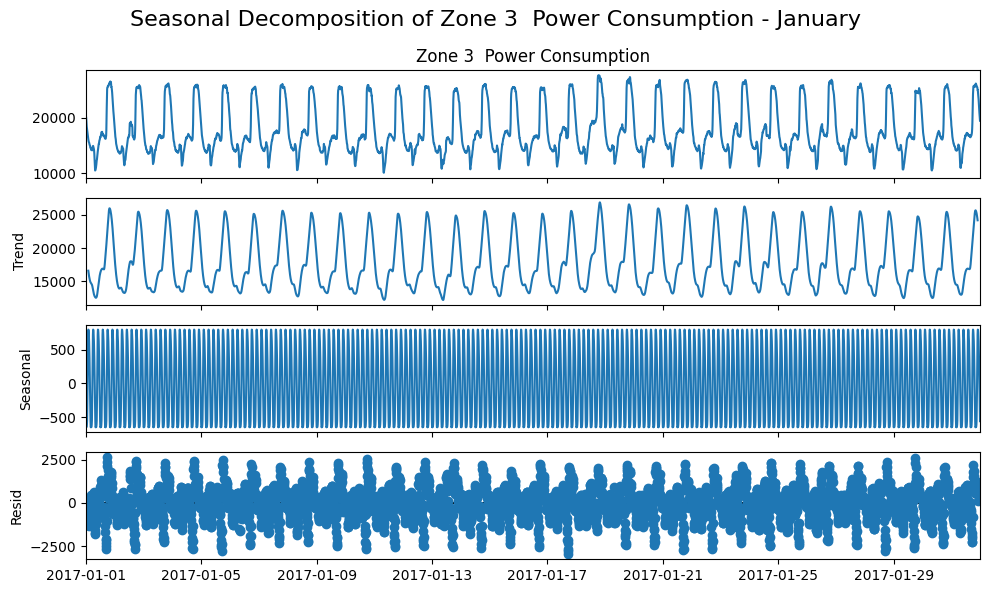

In [ ]:
decompose_monthly_timeseries(df, target_column='Zone 3  Power Consumption', month=1, period=24)


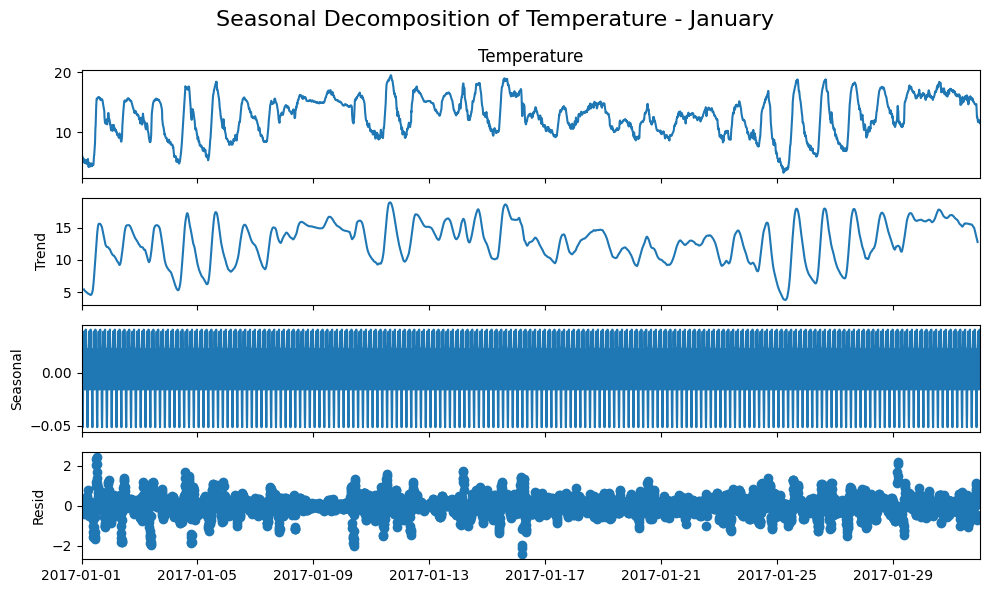

In [ ]:
decompose_monthly_timeseries(df, target_column='Temperature', month=1, period=24)


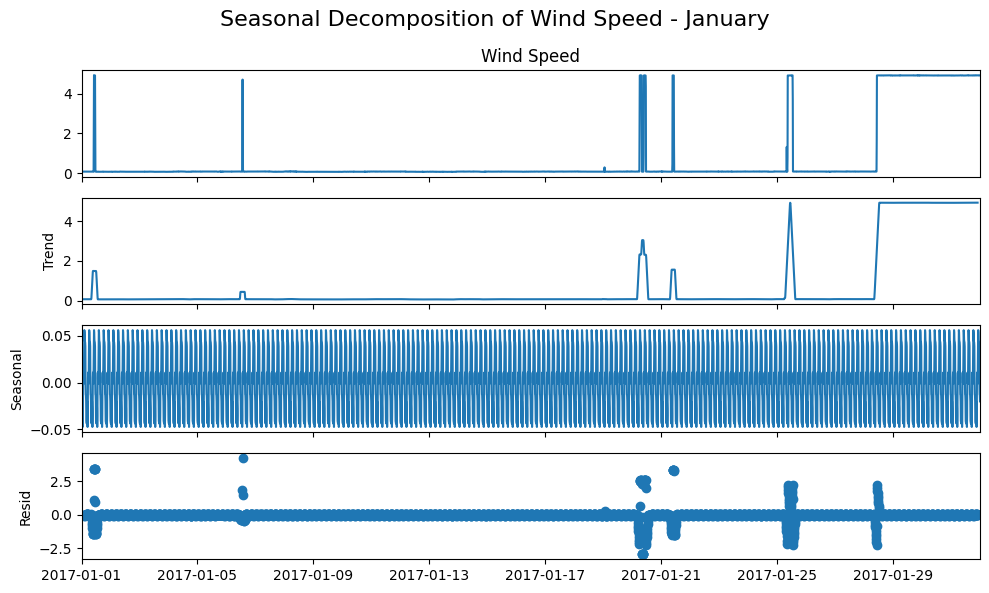

In [ ]:
decompose_monthly_timeseries(df, target_column='Wind Speed', month=1, period=24)


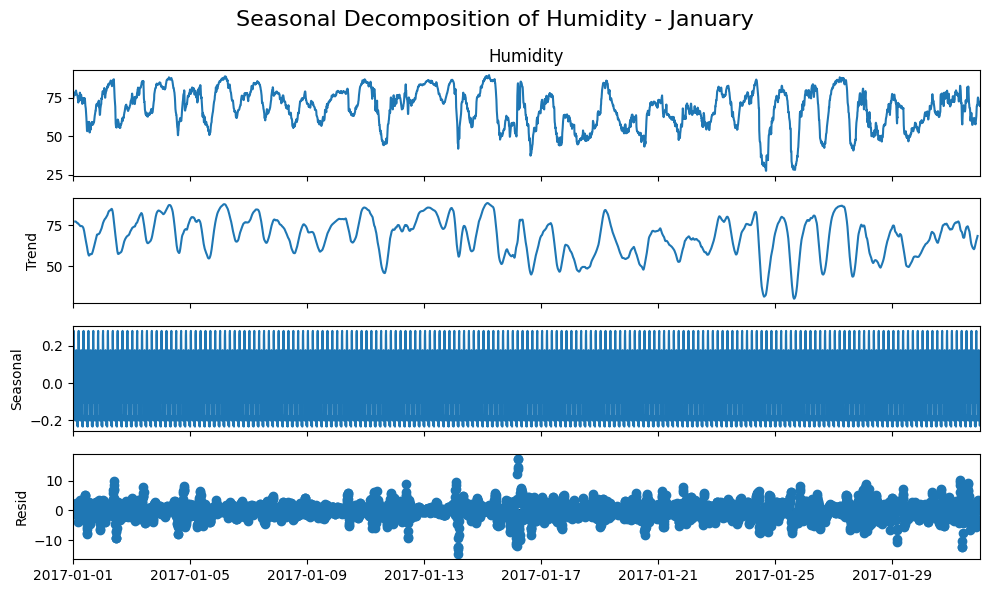

In [ ]:
decompose_monthly_timeseries(df, target_column='Humidity', month=1, period=24)


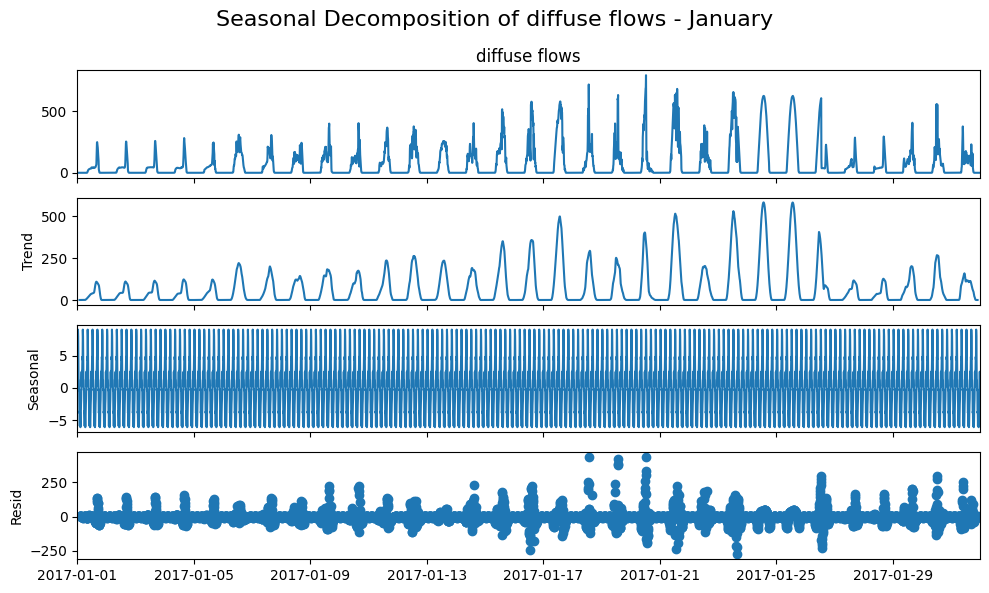

In [ ]:
decompose_monthly_timeseries(df, target_column='diffuse flows', month=1, period=24)

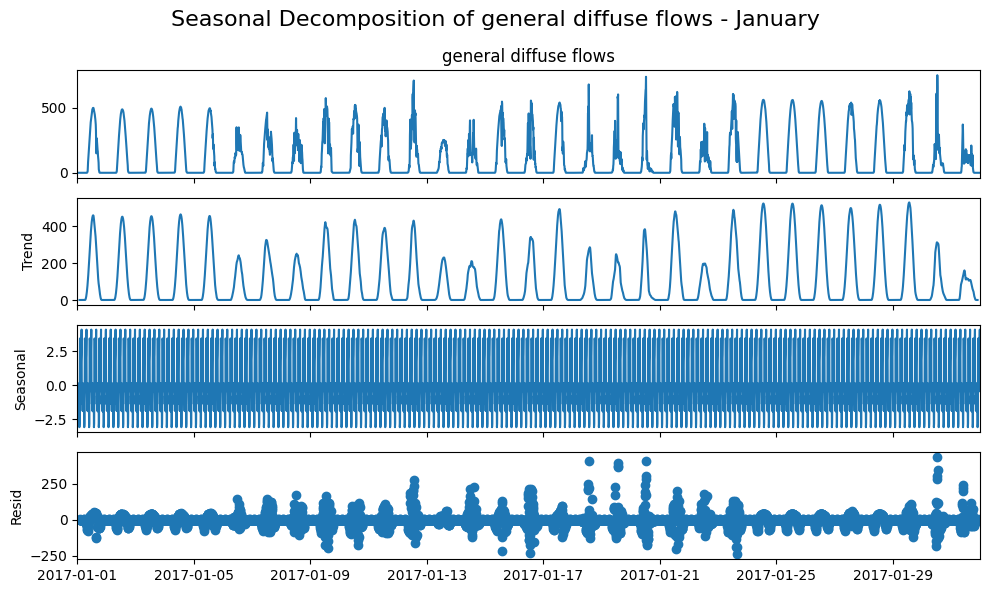

In [ ]:
decompose_monthly_timeseries(df, target_column='general diffuse flows', month=1, period=24)

### Decomposition


In [ ]:
final_df = pd.concat([
    Hourly_avg_zone1,
    Hourly_avg_zone2,
    Hourly_avg_zone3,
    Hourly_gdf['max'],
    Hourly_df['max'],
    hourly_wind_stats['mean'],
    Hourly_temp_stats['mean'],
    Hourly_humidity['mean']
], axis=1)

final_df.columns = ['Zone1', 'Zone2', 'Zone3', 'GDF_max', 'DF_max', 'Wind_mean','Temp_mean', 'Humidity_mean']
final_df = final_df.dropna()
final_df[["Zone1", "Zone2", "Zone3"]] = final_df[["Zone1", "Zone2", "Zone3"]] / 1e5


In [ ]:
final_df.columns

Index(['Zone1', 'Zone2', 'Zone3', 'GDF_max', 'DF_max', 'Wind_mean',
       'Temp_mean', 'Humidity_mean'],
      dtype='object')

In [ ]:
final_df.tail()

,Zone1,Zone2,Zone3,GDF_max,DF_max,Wind_mean,Temp_mean,Humidity_mean
DateTime,,,,,,,,
2017-12-30 19:00:00,2.250829,1.949862,1.015606,0.062,0.119,0.074667,9.453333,62.406667
2017-12-30 20:00:00,2.220532,1.921215,1.019928,0.073,0.145,0.080333,9.041667,63.990000
2017-12-30 21:00:00,2.121490,1.845474,0.996533,0.088,0.134,0.081500,8.011667,69.675000
2017-12-30 22:00:00,2.039605,1.708647,0.936893,0.070,0.122,0.081833,7.598333,70.315000
2017-12-30 23:00:00,1.806479,1.542805,0.848615,0.084,0.111,0.081500,6.877500,72.900000


In [ ]:
def decompose_and_plot(series, title, period=7):
    result = seasonal_decompose(series, model='additive', period=period)
    fig = result.plot()
    fig.set_size_inches(10, 6)
    plt.suptitle(f'Seasonal Decomposition of {title}', fontsize=16)
    plt.tight_layout()
    plt.show()


In [ ]:
from statsmodels.tsa.seasonal import seasonal_decompose
import matplotlib.pyplot as plt

def decompose_and_plot_month(series, title, period=24):
    # Filter one month of data — assuming datetime index
    one_month_data = series.loc[series.index.month == series.index[0].month]

    # Seasonal decomposition
    result = seasonal_decompose(one_month_data, model='additive', period=period)

    # Plotting
    fig = result.plot()
    fig.set_size_inches(10, 6)
    plt.suptitle(f'Seasonal Decomposition of {title} (One Month)', fontsize=16)
    plt.tight_layout()
    plt.show()


In [ ]:
import matplotlib.pyplot as plt
from statsmodels.tsa.seasonal import seasonal_decompose

def decompose_monthly_timeseries(final_df, target_column, month, period=24):
    """
    Performs seasonal decomposition on one month's worth of hourly data
    for a specified target column in final_df.

    Parameters:
    - final_df: DataFrame with DateTime index and target columns.
    - target_column: Column name to decompose (e.g., 'Zone1').
    - month: Month number (1 for January, ..., 12 for December).
    - period: Seasonal period (default=24 for hourly daily seasonality).
    """

    # Ensure DateTime index
    if not final_df.index.inferred_type.startswith('datetime'):
        raise ValueError("Index must be of datetime type")

    # Filter the data for the given month
    monthly_series = final_df[final_df.index.month == month][target_column]

    # If no data is available
    if monthly_series.empty:
        print(f"No data found for month {month} in column '{target_column}'")
        return

    try:
        # Decomposition
        result = seasonal_decompose(monthly_series, model='additive', period=period)

        # Plotting the result
        fig = result.plot()
        fig.set_size_inches(12, 8)
        plt.suptitle(
            f"Seasonal Decomposition of '{target_column}' - {monthly_series.index[0].strftime('%B')}",
            fontsize=16
        )
        plt.tight_layout()
        plt.show()

    except ValueError as e:
        print(f"Decomposition failed: {e}")


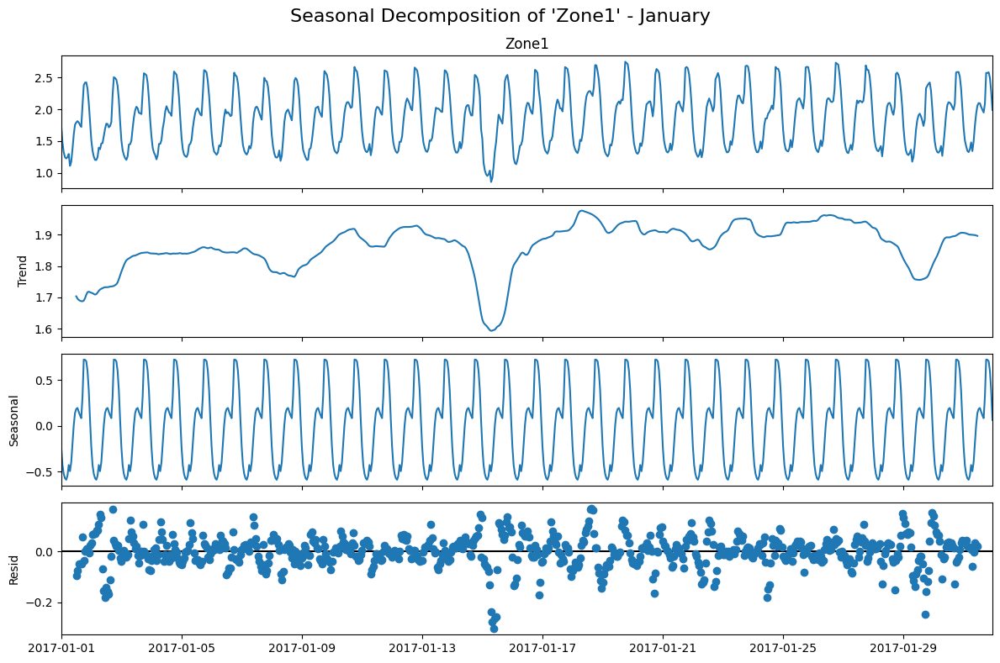

In [ ]:
# Decompose 'Zone1' data for December
decompose_monthly_timeseries(final_df, target_column='Zone1', month=1)

# You can change the month or column as needed:
# decompose_monthly_timeseries(final_df, 'Temp_mean', 1)


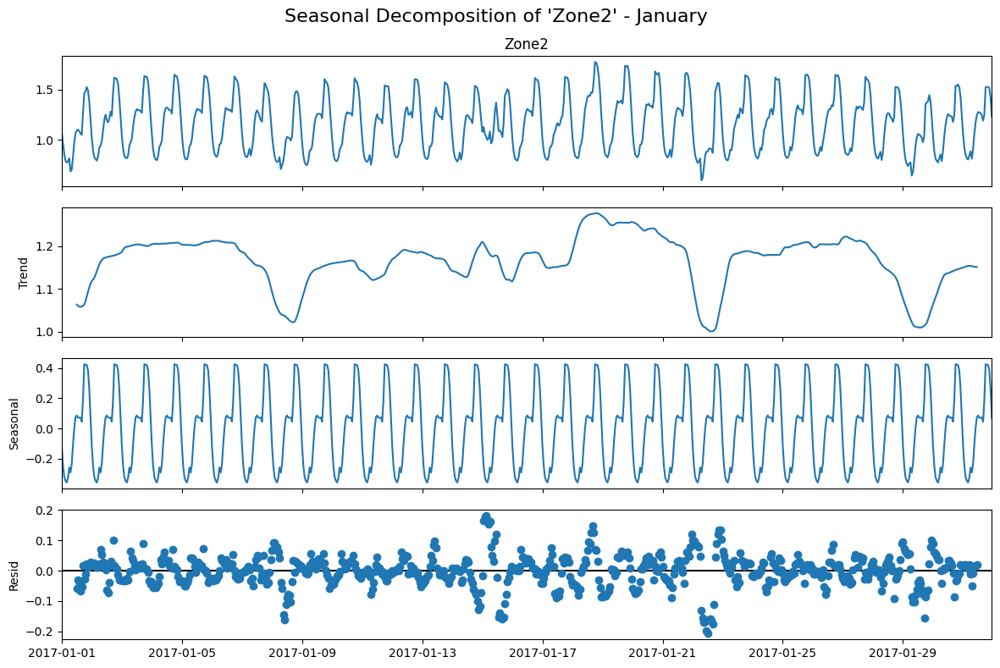

In [ ]:
decompose_monthly_timeseries(final_df, target_column='Zone2', month=1)

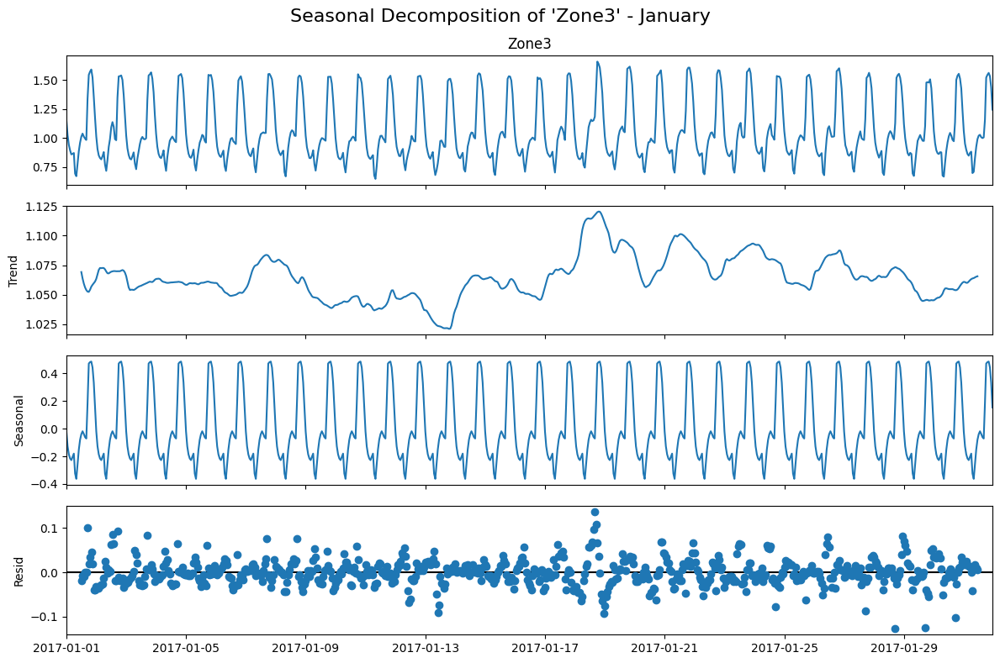

In [ ]:
decompose_monthly_timeseries(final_df, target_column='Zone3', month=1)

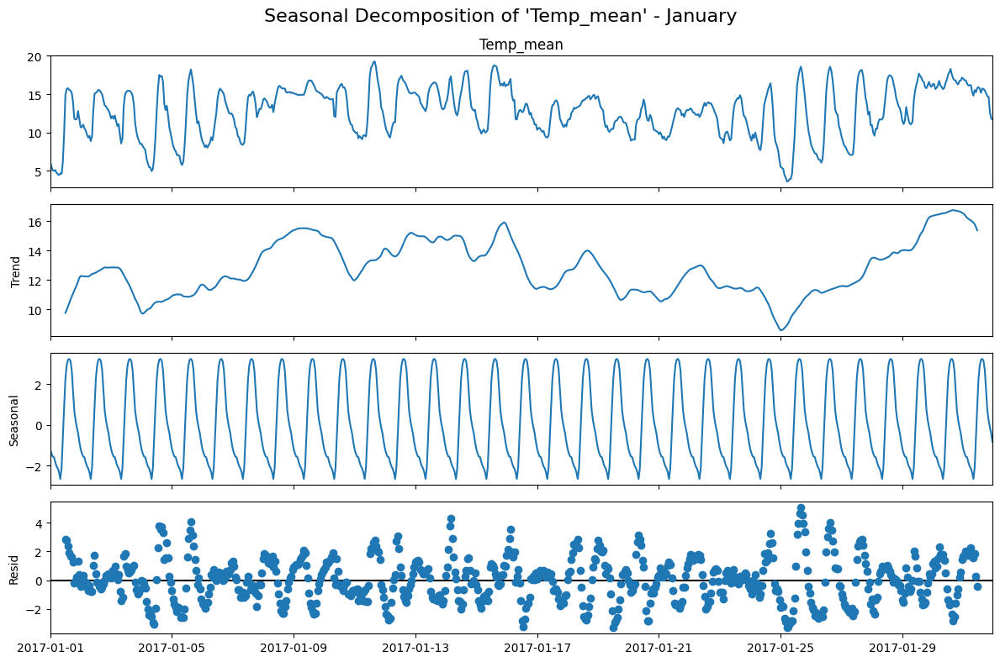

In [ ]:


decompose_monthly_timeseries(final_df, target_column='Temp_mean', month=1)


In [ ]:
# Set the month
month = 1



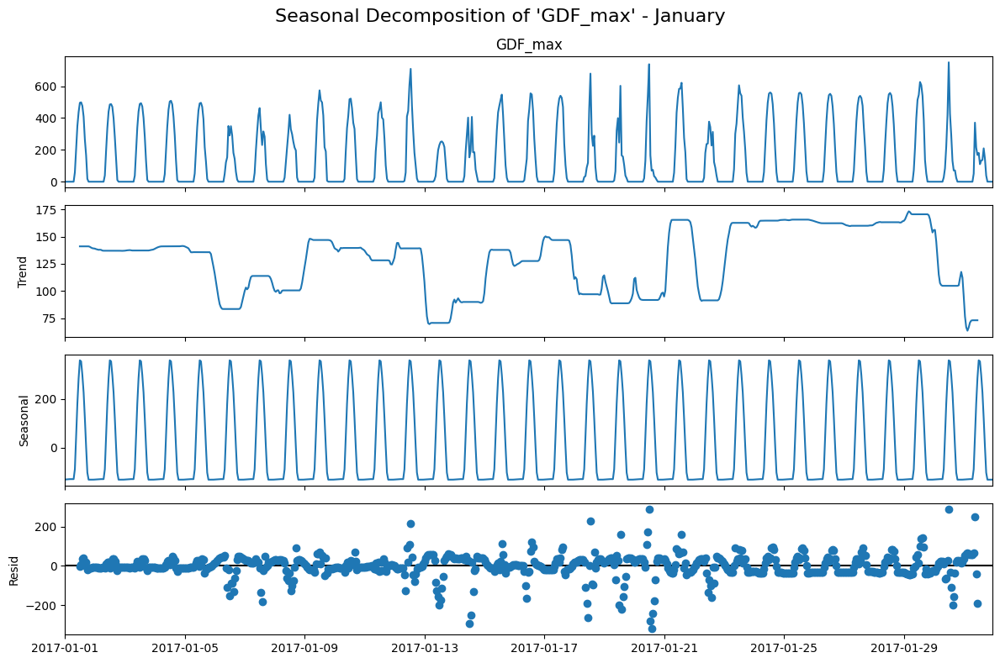

In [ ]:
# GDF max
decompose_monthly_timeseries(final_df, target_column='GDF_max', month=month)

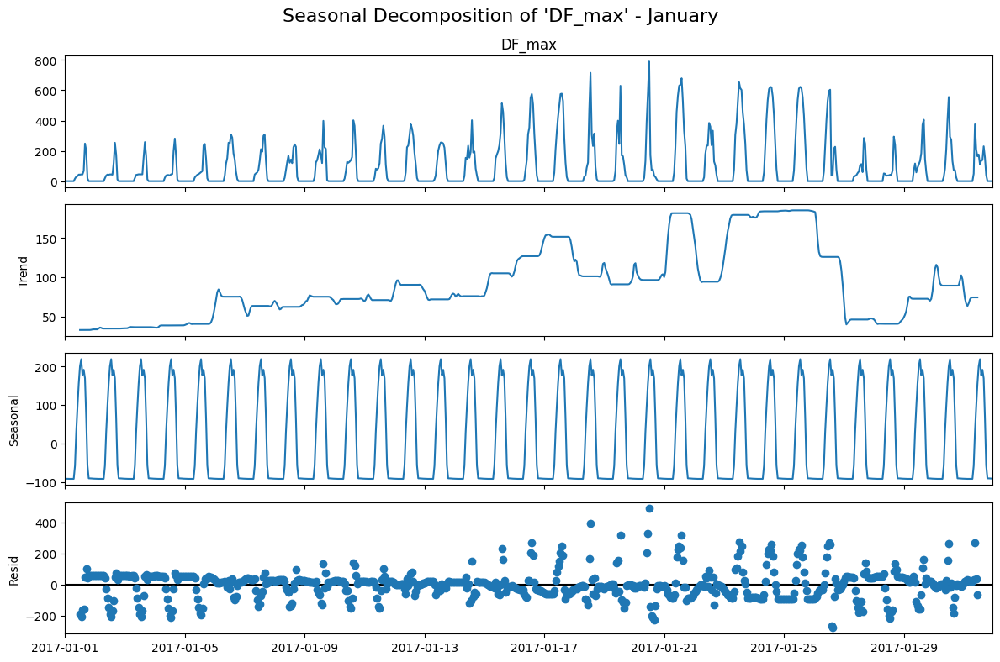

In [ ]:
# DF max
decompose_monthly_timeseries(final_df, target_column='DF_max', month=month)


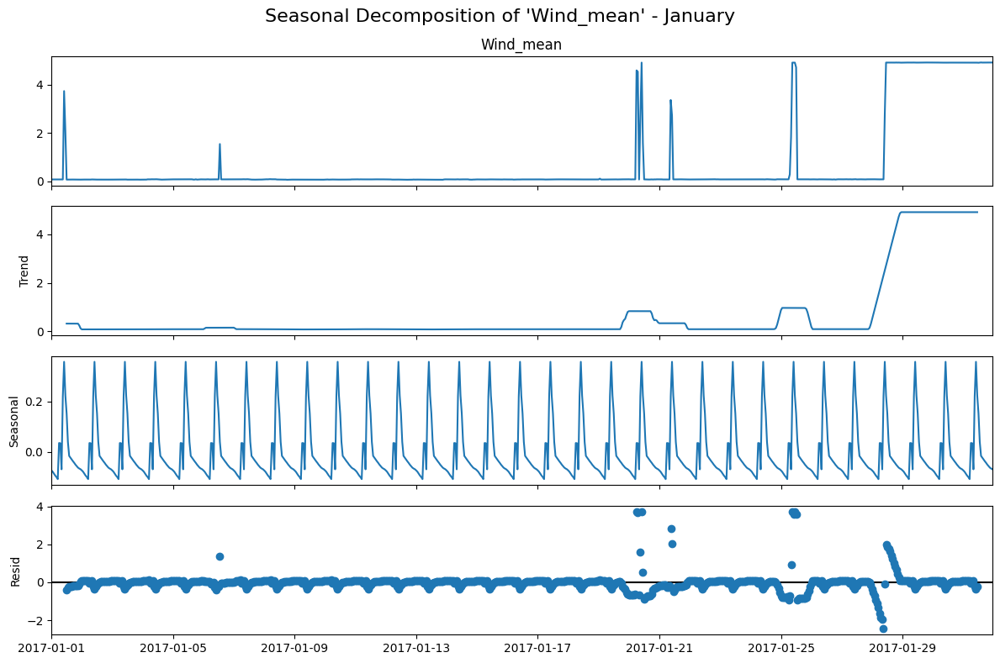

In [ ]:
# Wind mean
decompose_monthly_timeseries(final_df, target_column='Wind_mean', month=month)

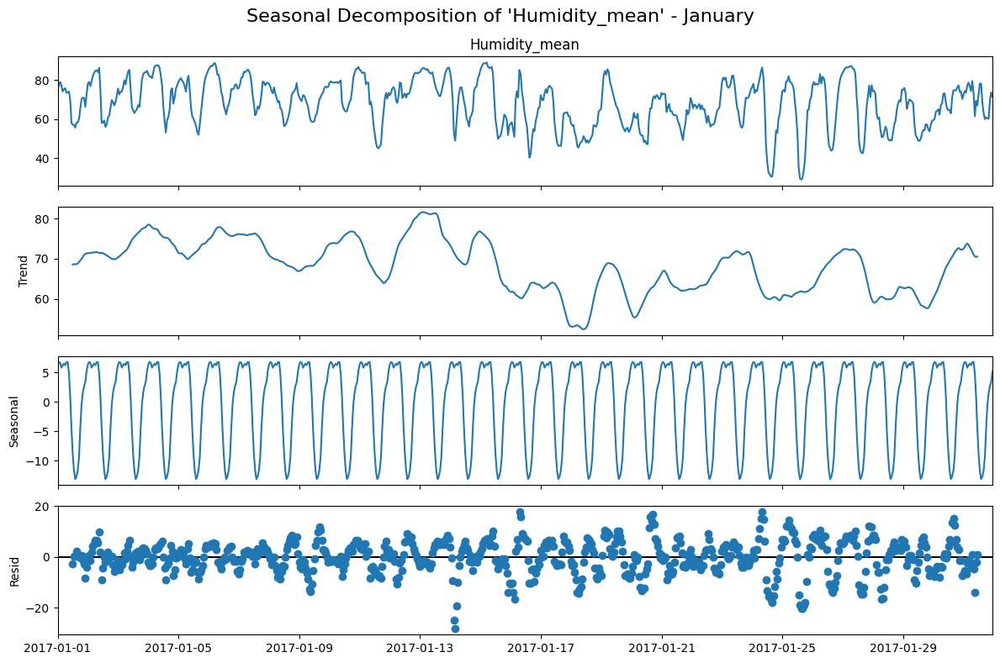

In [ ]:
# Humidity mean
decompose_monthly_timeseries(final_df, target_column='Humidity_mean', month=month)

# Checking for Stationarity

In [ ]:
def check_stationarity(series):
    result = adfuller(series.dropna())
    print("ADF Statistic:", result[0])
    print("p-value:", result[1])
    if result[1] < 0.05:
        print("Data is stationary")
    else:
        print("Data is NOT stationary, differencing needed")

In [ ]:
for column in final_df:
  print(column)
  result = check_stationarity(final_df[column])
  print(result)
  print('--------------------------------------')

Zone1
ADF Statistic: -4.445856092337989
p-value: 0.0002460164192498004
Data is stationary
None
--------------------------------------
Zone2
ADF Statistic: -4.685281696928967
p-value: 8.967662424157647e-05
Data is stationary
None
--------------------------------------
Zone3
ADF Statistic: -1.261180159380063
p-value: 0.6467401262072529
Data is NOT stationary, differencing needed
None
--------------------------------------
GDF_max
ADF Statistic: -5.460868803550021
p-value: 2.520418972195557e-06
Data is stationary
None
--------------------------------------
DF_max
ADF Statistic: -5.9512866953570835
p-value: 2.1441862277404265e-07
Data is stationary
None
--------------------------------------
Wind_mean
ADF Statistic: -6.530143526820753
p-value: 9.916796327249786e-09
Data is stationary
None
--------------------------------------
Temp_mean
ADF Statistic: -3.081245552489237
p-value: 0.027972594313788308
Data is stationary
None
--------------------------------------
Humidity_mean
ADF Statistic:

 Above we can see that only Diffuse Flow, Wind speed the Humidity are stationary and hence differencing is not needed for them but for the rest we do need differencing

In [ ]:
diff_Zone1 = final_df['Zone1'].diff().dropna()
diff_Zone2 = final_df['Zone2'].diff().dropna()
diff_Zone3 = final_df['Zone3'].diff().dropna()

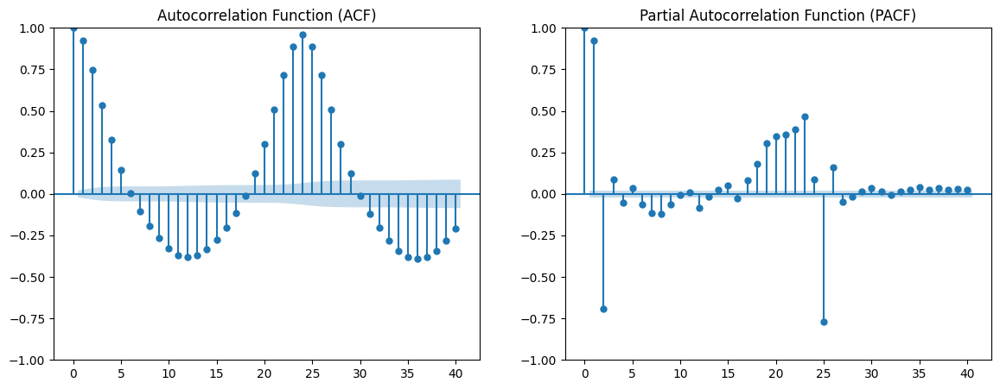

In [ ]:
fig, ax = plt.subplots(1, 2, figsize=(14, 5))

plot_acf(final_df['Zone1'], ax=ax[0], lags=40)
ax[0].set_title("Autocorrelation Function (ACF)")

plot_pacf(final_df['Zone1'], ax=ax[1], lags=40)
ax[1].set_title("Partial Autocorrelation Function (PACF)")

plt.show()

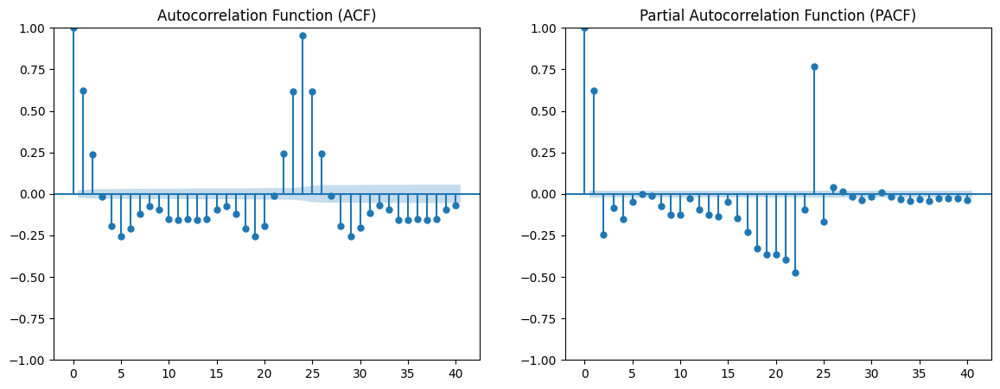

In [ ]:
fig, ax = plt.subplots(1, 2, figsize=(14, 5))

plot_acf(diff_Zone1, ax=ax[0], lags=40)
ax[0].set_title("Autocorrelation Function (ACF)")

plot_pacf(diff_Zone1, ax=ax[1], lags=40)
ax[1].set_title("Partial Autocorrelation Function (PACF)")

plt.show()

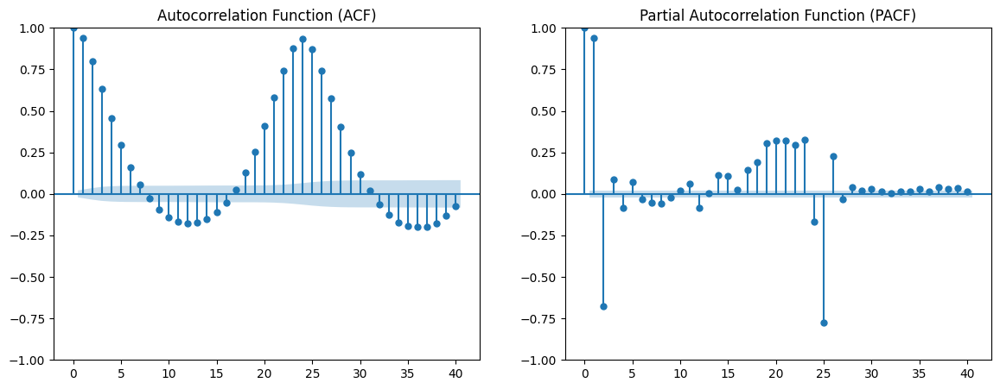

In [ ]:
fig, ax = plt.subplots(1, 2, figsize=(14, 5))

plot_acf(final_df['Zone2'], ax=ax[0], lags=40)
ax[0].set_title("Autocorrelation Function (ACF)")

plot_pacf(final_df['Zone2'], ax=ax[1], lags=40)
ax[1].set_title("Partial Autocorrelation Function (PACF)")

plt.show()

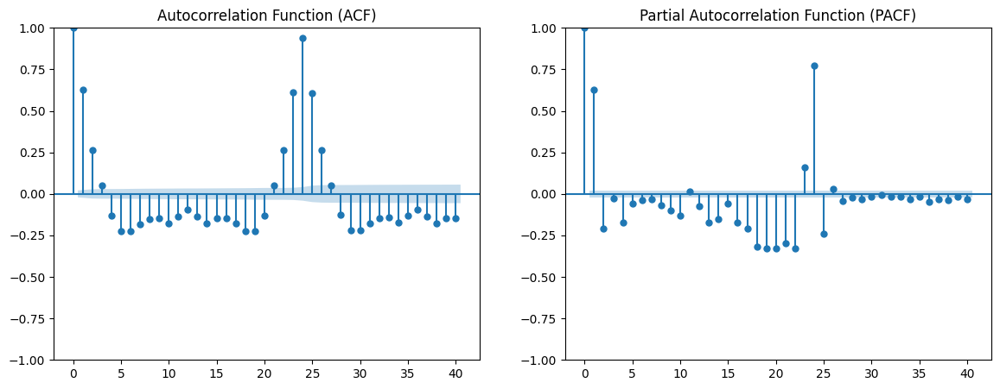

In [ ]:
fig, ax = plt.subplots(1, 2, figsize=(14, 5))

plot_acf(diff_Zone2, ax=ax[0], lags=40)
ax[0].set_title("Autocorrelation Function (ACF)")

plot_pacf(diff_Zone2, ax=ax[1], lags=40)
ax[1].set_title("Partial Autocorrelation Function (PACF)")

plt.show()

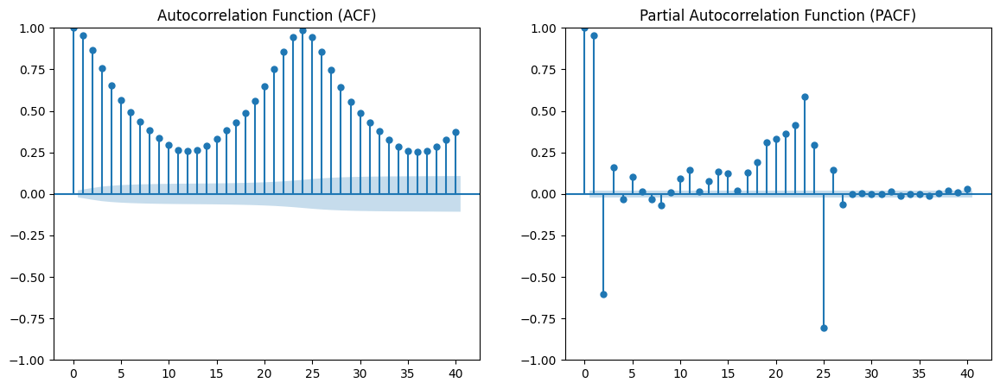

In [ ]:
fig, ax = plt.subplots(1, 2, figsize=(14, 5))

plot_acf(final_df['Zone3'], ax=ax[0], lags=40)
ax[0].set_title("Autocorrelation Function (ACF)")

plot_pacf(final_df['Zone3'], ax=ax[1], lags=40)
ax[1].set_title("Partial Autocorrelation Function (PACF)")

plt.show()

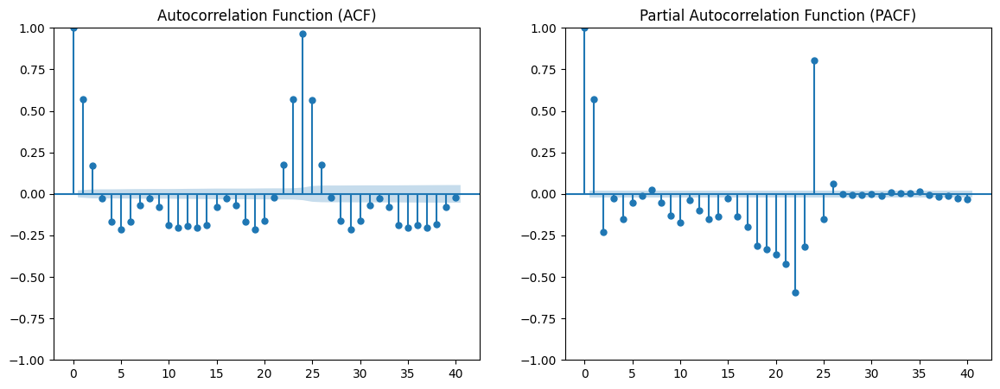

In [ ]:
fig, ax = plt.subplots(1, 2, figsize=(14, 5))

plot_acf(diff_Zone3, ax=ax[0], lags=40)
ax[0].set_title("Autocorrelation Function (ACF)")

plot_pacf(diff_Zone3, ax=ax[1], lags=40)
ax[1].set_title("Partial Autocorrelation Function (PACF)")

plt.show()

# Getting the required month

In [ ]:
def get_month_data(df, target_column, month, drop_columns=[]):
    """
    Filters the dataframe for a specific month and returns X and y.

    Args:
        df (pd.DataFrame): Full DataFrame with datetime index.
        target_column (str): Name of the target column.
        month (int): Month number (1=Jan, ..., 12=Dec).
        drop_columns (list): List of columns to drop from X (excluding target).

    Returns:
        X (pd.DataFrame): Features for the selected month.
        y (pd.Series): Target variable for the selected month.
    """
    month_df = df[df.index.month == month]

    y = month_df[target_column]
    X = month_df.drop(columns=[target_column] + drop_columns)

    return X, y


In [ ]:
X, y = get_month_data(
    final_df,
    target_column='Zone1',
    month=1,
    drop_columns=['GDF_max', 'DF_max', 'Wind_mean']
)


In [ ]:
def plot_monthly_timeseries(df, target_column, month):
    """
    Filters the dataframe for a specific month and plots the time series of the target column.

    Args:
        df (pd.DataFrame): DataFrame with a datetime index.
        target_column (str): Column to plot (y-axis).
        month (int): Month to filter (1=Jan, ..., 12=Dec).
    """
    y = df[df.index.month == month][target_column]

    plt.figure(figsize=(12, 5))
    plt.plot(y.index, y.values, label=f'{target_column} Load', color='blue')
    plt.title(f"{target_column} Load - {y.index[0].strftime('%B')}")
    plt.xlabel("Date")
    plt.ylabel(target_column)
    plt.grid(True)
    plt.legend()
    plt.tight_layout()
    plt.show()


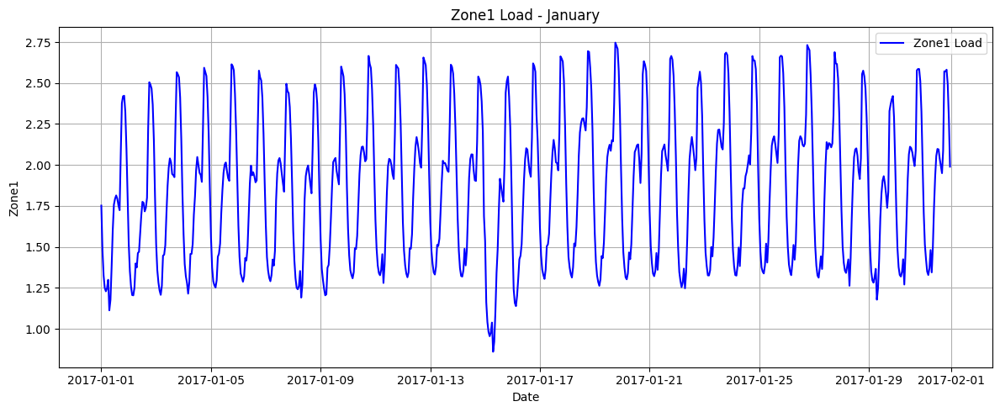

In [ ]:
plot_monthly_timeseries(final_df, target_column='Zone1', month=1)


# __________________________ **TRAIN - VAL - TEST**________________________




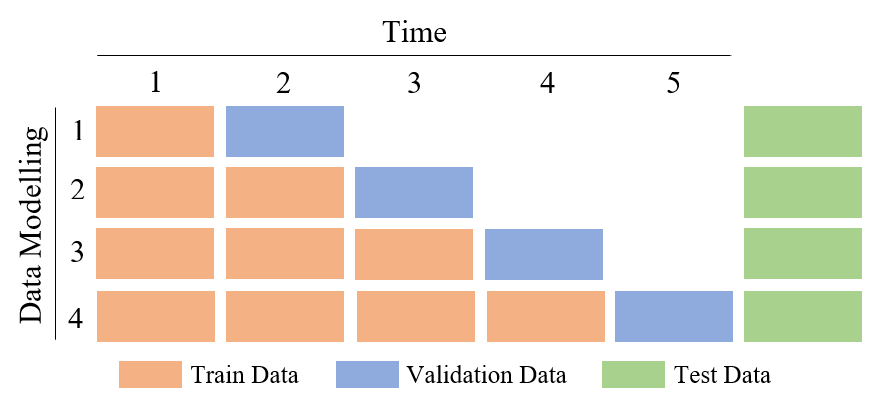

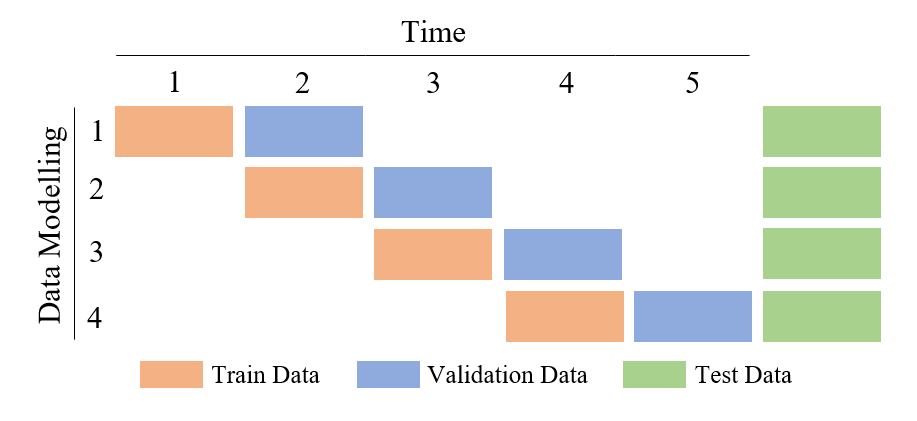

In [ ]:
n = len(X)
train_size = int(n * 0.85)

X_train = X.iloc[:train_size]
y_train = y.iloc[:train_size]

X_test = X.iloc[train_size:]
y_test = y.iloc[train_size:]

In [ ]:
y_train

,Zone1
DateTime,
2017-01-01 00:00:00,1.751878
2017-01-01 01:00:00,1.479433
2017-01-01 02:00:00,1.324982
2017-01-01 03:00:00,1.248668
2017-01-01 04:00:00,1.228557
...,...
2017-01-27 03:00:00,1.324739
2017-01-27 04:00:00,1.312041
2017-01-27 05:00:00,1.373043


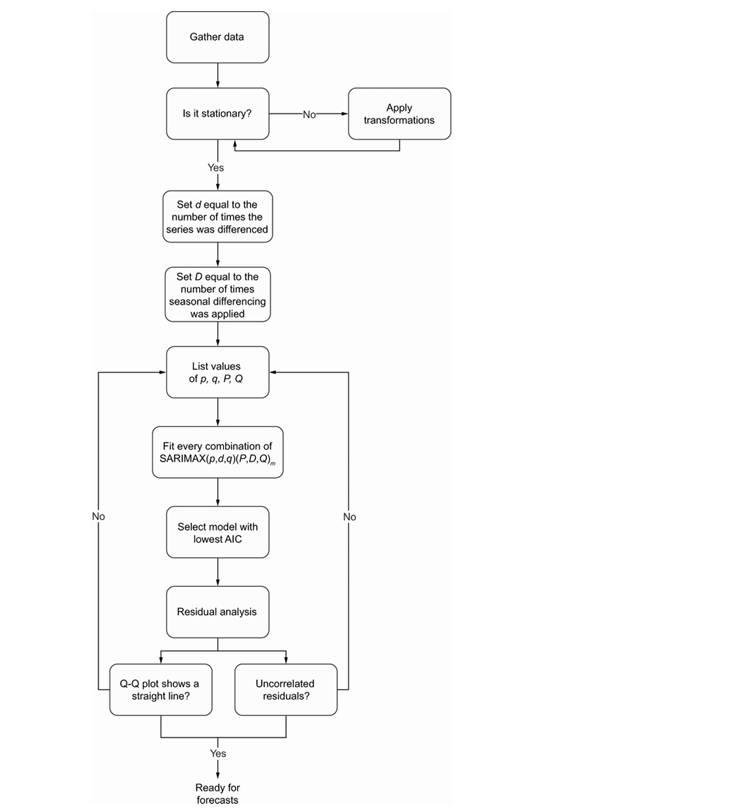

# ARIMA

### ARIMA(6,0,6)

In [ ]:
p_values = range(0, 7,1)
q_values = range(0, 7,1)
pq_combinations = list(product(p_values, q_values))

def optimize_ARIMA(endog: pd.Series, order_list: list, d: int = 0) -> pd.DataFrame:
    results = []
    for order in tqdm_notebook(order_list):
        try:
            model = ARIMA(endog, order=(order[0], d, order[1])).fit()
            aic = model.aic
            results.append([(order[0], d, order[1]), aic])
        except:
            continue
    result_df = pd.DataFrame(results, columns=['(p,d,q)', 'AIC']).sort_values(by='AIC').reset_index(drop=True)
    return result_df

ARIMA_result_df = optimize_ARIMA(y, pq_combinations, d=0)

ARIMA_result_df


  0%|          | 0/49 [00:00<?, ?it/s]

,"(p,d,q)",AIC
0,"(6, 0, 6)",-1264.961797
1,"(6, 0, 4)",-1236.039922
2,"(5, 0, 2)",-1173.449130
3,"(6, 0, 3)",-1171.008953
4,"(6, 0, 5)",-1169.742567
5,"(5, 0, 3)",-1169.194609
6,"(5, 0, 4)",-1146.718057
7,"(4, 0, 4)",-1129.046127
8,"(2, 0, 6)",-1128.157783
9,"(3, 0, 3)",-1124.162679


In [ ]:
n = len(X)
train_end = int(n * 0.7)
val_end = int(n * 0.85)

train = y[:train_end]
val = y[train_end:val_end]
test = y[val_end:]

model = ARIMA(train, order=(6,0,6)).fit()

val_forecast = model.predict(start=len(train), end=len(train)+len(val)-1, dynamic=True)
test_forecast = model.predict(start=len(train)+len(val), end=n-1)
train_pred = model.predict(start=0, end=train_end-1)

def evaluate(true, pred):
    rmse = np.sqrt(mean_squared_error(true, pred))
    mape = mean_absolute_percentage_error(true, pred)
    r2 = r2_score(true, pred)
    return rmse, mape, r2


train_metrics = evaluate(train, train_pred)
val_metrics = evaluate(val, val_forecast)
test_metrics = evaluate(test, test_forecast)

print("\n ARIMA(6,0,6) Model Performance:")
print(f"Train  - RMSE: {train_metrics[0]:.2f}, MAPE: {train_metrics[1]:.2%}, R²: {train_metrics[2]:.4f}")
print(f"Val    - RMSE: {val_metrics[0]:.2f}, MAPE: {val_metrics[1]:.2%}, R²: {val_metrics[2]:.4f}")
print(f"Test   - RMSE: {test_metrics[0]:.2f}, MAPE: {test_metrics[1]:.2%}, R²: {test_metrics[2]:.4f}")


 ARIMA(6,0,6) Model Performance:
Train  - RMSE: 0.10, MAPE: 4.10%, R²: 0.9485
Val    - RMSE: 0.46, MAPE: 20.80%, R²: -0.0261
Test   - RMSE: 0.42, MAPE: 20.07%, R²: -0.0191


###------------------------ARIMA(24,0,24)------------------------------------------

In [ ]:
test_size = len(y_test)
tscv = TimeSeriesSplit(n_splits=3, test_size=test_size)

val_preds = []
true_vals = []
val_indices = []

print("Time Series Cross-Validation Metrics:")
for i, (train_idx, val_idx) in enumerate(tscv.split(X_train)):
    X_train_fold, X_val_fold = X_train.iloc[train_idx], X_train.iloc[val_idx]
    y_train_fold, y_val_fold = y_train.iloc[train_idx], y_train.iloc[val_idx]

    model = ARIMA(y_train_fold, order=(24, 0, 24)).fit()

    forecast = model.get_forecast(steps=len(X_val_fold))
    preds = forecast.predicted_mean.values

    val_preds.extend(preds)
    true_vals.extend(y_val_fold.values)
    val_indices.extend(y_val_fold.index)

    fold_rmse = np.sqrt(mean_squared_error(y_val_fold, preds))
    fold_mape = mean_absolute_percentage_error(y_val_fold, preds) * 100
    fold_r2 = r2_score(y_val_fold, preds)

    print(f"Split {i+1}: RMSE={fold_rmse:.2f}, MAPE={fold_mape:.2f}%, R²={fold_r2:.4f}")


Time Series Cross-Validation Metrics:
Split 1: RMSE=0.20, MAPE=9.00%, R²=0.8221
Split 2: RMSE=0.12, MAPE=5.66%, R²=0.9266
Split 3: RMSE=0.10, MAPE=4.66%, R²=0.9512


In [ ]:
val_rmse = np.sqrt(mean_squared_error(true_vals, val_preds))
val_mape = mean_absolute_percentage_error(true_vals, val_preds) * 100
val_r2 = r2_score(true_vals, val_preds)

print(f"\nAggregated CV Metrics:")
print(f"  RMSE: {val_rmse:.2f}")
print(f"  MAPE: {val_mape:.2f}%")
print(f"  R²: {val_r2:.4f}")


Aggregated CV Metrics:
  RMSE: 0.15
  MAPE: 6.44%
  R²: 0.8986


In [ ]:
ARIMA_model = ARIMA(y_train, order=(24, 0, 24)).fit()

test_forecast = ARIMA_model.get_forecast(steps=len(X_test))
test_pred = test_forecast.predicted_mean.values

test_rmse = np.sqrt(mean_squared_error(y_test, test_pred))
test_mape = mean_absolute_percentage_error(y_test, test_pred) * 100
test_r2 = r2_score(y_test, test_pred)

print(f"\nTest Metrics:")
print(f"  RMSE: {test_rmse:.2f}")
print(f"  MAPE: {test_mape:.2f}%")
print(f"  R²: {test_r2:.4f}")




Test Metrics:
  RMSE: 0.11
  MAPE: 4.01%
  R²: 0.9375


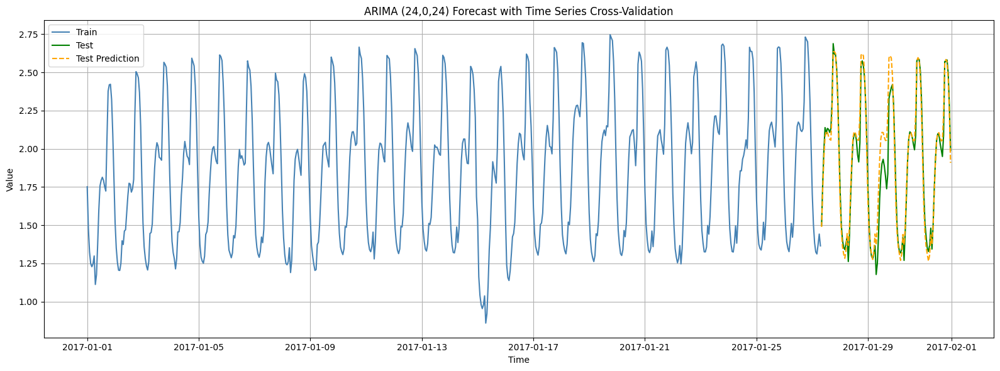

In [ ]:
test_pred_series = pd.Series(test_pred, index=y_test.index)

plt.figure(figsize=(16, 6))
plt.plot(y_train, label='Train', color='steelblue')
plt.plot(y_test, label='Test', color='green')
plt.plot(test_pred_series, '--', label='Test Prediction', color='orange')

plt.title("ARIMA (24,0,24) Forecast with Time Series Cross-Validation")
plt.xlabel("Time")
plt.ylabel("Value")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

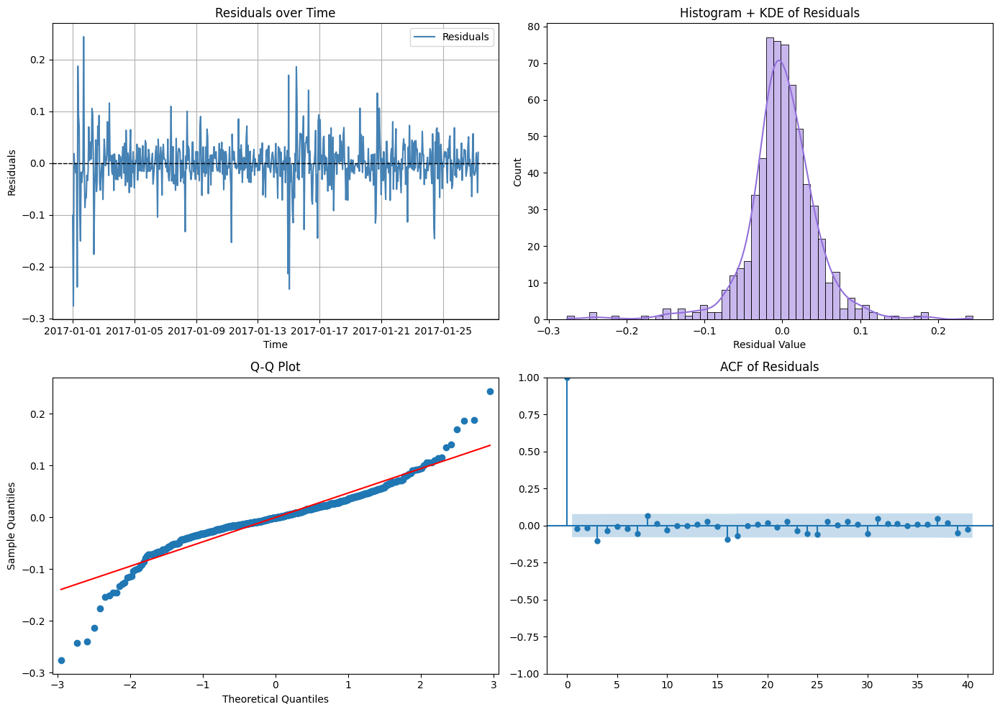

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
import statsmodels.api as sm
from statsmodels.graphics.tsaplots import plot_acf

# Get residuals
residuals = ARIMA_model.resid

# Create subplots
fig, axs = plt.subplots(2, 2, figsize=(14, 10))

# 1. Residuals over time
axs[0, 0].plot(residuals, label='Residuals', color='steelblue')
axs[0, 0].axhline(0, color='black', linestyle='--', linewidth=1)
axs[0, 0].set_title('Residuals over Time')
axs[0, 0].set_xlabel('Time')
axs[0, 0].set_ylabel('Residuals')
axs[0, 0].legend()
axs[0, 0].grid(True)

# 2. Histogram + KDE
sns.histplot(residuals, kde=True, ax=axs[0, 1], color='mediumpurple')
axs[0, 1].set_title('Histogram + KDE of Residuals')
axs[0, 1].set_xlabel('Residual Value')

# 3. Q-Q plot
sm.qqplot(residuals, line='s', ax=axs[1, 0])
axs[1, 0].set_title('Q-Q Plot')

# 4. ACF plot
plot_acf(residuals, ax=axs[1, 1], lags=40, alpha=0.05)
axs[1, 1].set_title('ACF of Residuals')

plt.tight_layout()
plt.show()


## SARIMA

In [ ]:
def optimize_SARIMA(endog: Union[pd.Series, list], order_list: list, d: int, D: int, s: int) -> pd.DataFrame:
    results = []

    for order in tqdm_notebook(order_list):
        try:
            model = SARIMAX(
                endog,
                order=(order[0], d, order[1]),
                seasonal_order=(order[2], D, order[3], s),
                simple_differencing=False
            ).fit(disp=False)
            aic = model.aic
            results.append([order, aic])
        except:
            continue

    if results:
        result_df = pd.DataFrame(results, columns=['(p,q,P,Q)', 'AIC'])
        result_df = result_df.sort_values(by='AIC').reset_index(drop=True)
        return result_df
    else:
        return pd.DataFrame(columns=['(p,q,P,Q)', 'AIC'])

In [ ]:
ps = range(0, 3)
qs = range(0, 3)
Ps = range(0, 3)
Qs = range(0, 3)

SARIMA_order_list = list(product(ps, qs, Ps, Qs))

train = y[:-5]

d = 1
D = 2
s = 24

SARIMA_result_df = optimize_SARIMA(train, SARIMA_order_list, d, D, s)
SARIMA_result_df

  0%|          | 0/81 [00:00<?, ?it/s]

,"(p,q,P,Q)",AIC
0,"(1, 2, 2, 1)",-2600.016911
1,"(2, 0, 2, 1)",-2598.052896
2,"(2, 2, 2, 1)",-2597.713432
3,"(1, 2, 1, 2)",-2597.179026
4,"(2, 1, 2, 1)",-2596.549820
...,...,...
76,"(0, 0, 2, 2)",-1184.038880
77,"(0, 0, 0, 1)",-1163.478569
78,"(0, 0, 2, 0)",-1073.298870
79,"(0, 0, 1, 0)",-1046.801413


In [ ]:
test_size = int(len(y_test))
tscv = TimeSeriesSplit(n_splits=3, test_size=test_size)

val_preds = []
true_vals = []
val_indices = []

print("Time Series Cross-Validation Metrics:")
for i, (train_idx, val_idx) in enumerate(tscv.split(X_train)):
    X_train_fold, X_val_fold = X_train.iloc[train_idx], X_train.iloc[val_idx]
    y_train_fold, y_val_fold = y_train.iloc[train_idx], y_train.iloc[val_idx]

    model = SARIMAX(
        y_train_fold,
        order=(2, 1, 2),
        seasonal_order=(1, 2, 2, 24),
        enforce_stationarity=False,
        enforce_invertibility=False
    ).fit(disp=False)

    forecast = model.get_forecast(steps=len(X_val_fold))
    preds = forecast.predicted_mean.values

    val_preds.extend(preds)
    true_vals.extend(y_val_fold.values)
    val_indices.extend(y_val_fold.index)

    fold_rmse = np.sqrt(mean_squared_error(y_val_fold, preds))
    fold_mape = mean_absolute_percentage_error(y_val_fold, preds) * 100
    fold_r2 = r2_score(y_val_fold, preds)

    print(f"Split {i+1}: RMSE={fold_rmse:.2f}, MAPE={fold_mape:.2f}%, R²={fold_r2:.4f}")

# 3. Aggregated Validation Metrics
val_rmse = np.sqrt(mean_squared_error(true_vals, val_preds))
val_mape = mean_absolute_percentage_error(true_vals, val_preds) * 100
val_r2 = r2_score(true_vals, val_preds)

print(f"\nAggregated CV Metrics:")
print(f"  RMSE: {val_rmse:.2f}")
print(f"  MAPE: {val_mape:.2f}%")
print(f"  R²: {val_r2:.4f}")

Time Series Cross-Validation Metrics:
Split 1: RMSE=0.27, MAPE=14.06%, R²=0.6758
Split 2: RMSE=0.10, MAPE=4.03%, R²=0.9555
Split 3: RMSE=0.08, MAPE=4.05%, R²=0.9672

Aggregated CV Metrics:
  RMSE: 0.17
  MAPE: 7.38%
  R²: 0.8623



Test Metrics:
  RMSE: 0.12
  MAPE: 4.57%
  R²: 0.9199


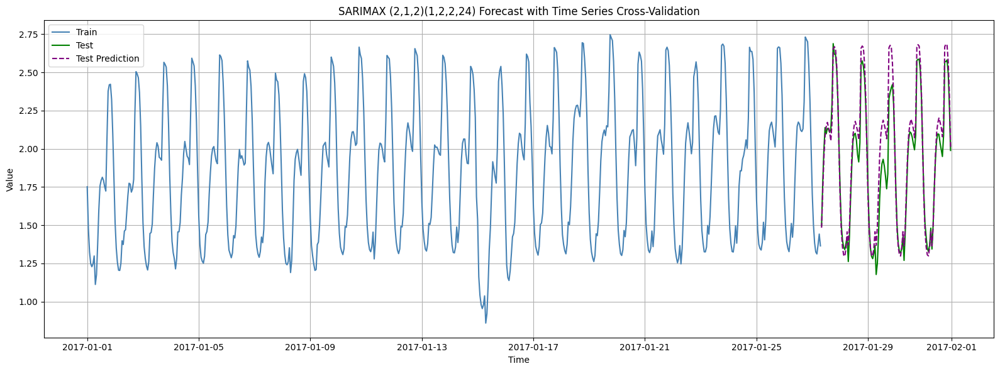

In [ ]:
SARIMA_model = SARIMAX(
    y_train,
    order=(2, 1, 2),
    seasonal_order=(1, 2, 2, 24),
    enforce_stationarity=False,
    enforce_invertibility=False
).fit(disp=False)

test_forecast = SARIMA_model.get_forecast(steps=len(X_test))
test_pred = test_forecast.predicted_mean.values

test_rmse = np.sqrt(mean_squared_error(y_test, test_pred))
test_mape = mean_absolute_percentage_error(y_test, test_pred) * 100
test_r2 = r2_score(y_test, test_pred)

print(f"\nTest Metrics:")
print(f"  RMSE: {test_rmse:.2f}")
print(f"  MAPE: {test_mape:.2f}%")
print(f"  R²: {test_r2:.4f}")

test_pred_series = pd.Series(test_pred, index=y_test.index)

plt.figure(figsize=(16, 6))
plt.plot(y_train, label='Train', color='steelblue')
plt.plot(y_test, label='Test', color='green')
plt.plot(test_pred_series, '--', label='Test Prediction', color='purple')

plt.title("SARIMAX (2,1,2)(1,2,2,24) Forecast with Time Series Cross-Validation")
plt.xlabel("Time")
plt.ylabel("Value")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

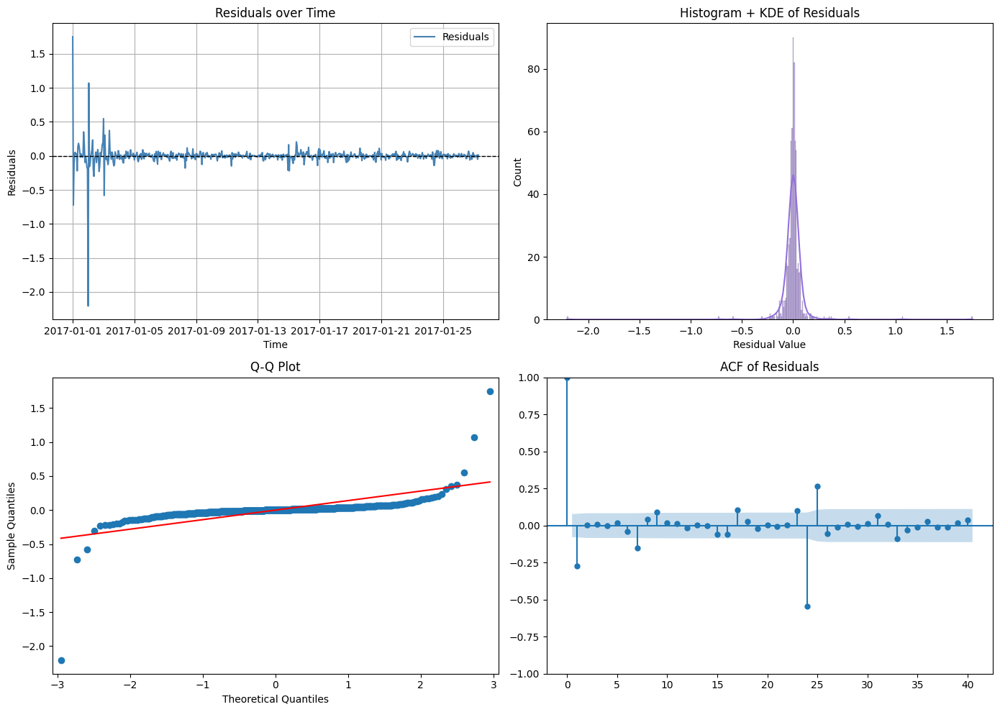

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
import statsmodels.api as sm
from statsmodels.graphics.tsaplots import plot_acf

# Get residuals
residuals = SARIMA_model.resid

# Create subplots
fig, axs = plt.subplots(2, 2, figsize=(14, 10))

# 1. Residuals over time
axs[0, 0].plot(residuals, label='Residuals', color='steelblue')
axs[0, 0].axhline(0, color='black', linestyle='--', linewidth=1)
axs[0, 0].set_title('Residuals over Time')
axs[0, 0].set_xlabel('Time')
axs[0, 0].set_ylabel('Residuals')
axs[0, 0].legend()
axs[0, 0].grid(True)

# 2. Histogram + KDE
sns.histplot(residuals, kde=True, ax=axs[0, 1], color='mediumpurple')
axs[0, 1].set_title('Histogram + KDE of Residuals')
axs[0, 1].set_xlabel('Residual Value')

# 3. Q-Q plot
sm.qqplot(residuals, line='s', ax=axs[1, 0])
axs[1, 0].set_title('Q-Q Plot')

# 4. ACF plot
plot_acf(residuals, ax=axs[1, 1], lags=40, alpha=0.05)
axs[1, 1].set_title('ACF of Residuals')

plt.tight_layout()
plt.show()


# SARIMAX

In [ ]:
test_size = int(len(y_test))
tscv = TimeSeriesSplit(n_splits=3, test_size=test_size)

val_preds = []
true_vals = []
val_indices = []

print("Time Series Cross-Validation Metrics with Exogenous Features:")

for i, (train_idx, val_idx) in enumerate(tscv.split(X_train)):
    # Convert to DataFrames for slicing if not already
    if isinstance(X_train, np.ndarray):
        X_train = pd.DataFrame(X_train)
    if isinstance(y_train, np.ndarray):
        y_train = pd.Series(y_train)

    X_train_fold, X_val_fold = X_train.iloc[train_idx], X_train.iloc[val_idx]
    y_train_fold, y_val_fold = y_train.iloc[train_idx], y_train.iloc[val_idx]

    # Fit SARIMAX with exogenous features
    model = SARIMAX(
        y_train_fold,
        exog=X_train_fold,
        order=(2, 1, 2),
        seasonal_order=(1, 2, 2, 24),
        enforce_stationarity=False,
        enforce_invertibility=False
    ).fit(disp=False)

    # Forecast using exog from the validation set
    forecast = model.get_forecast(steps=len(X_val_fold), exog=X_val_fold)
    preds = forecast.predicted_mean.values

    val_preds.extend(preds)
    true_vals.extend(y_val_fold.values)
    val_indices.extend(y_val_fold.index)

    fold_rmse = np.sqrt(mean_squared_error(y_val_fold, preds))
    fold_mape = mean_absolute_percentage_error(y_val_fold, preds) * 100
    fold_r2 = r2_score(y_val_fold, preds)

    print(f"Split {i+1}: RMSE={fold_rmse:.2f}, MAPE={fold_mape:.2f}%, R²={fold_r2:.4f}")

# 3. Aggregated Validation Metrics
val_rmse = np.sqrt(mean_squared_error(true_vals, val_preds))
val_mape = mean_absolute_percentage_error(true_vals, val_preds) * 100
val_r2 = r2_score(true_vals, val_preds)

print(f"\nAggregated CV Metrics with Exogenous Features:")
print(f"  RMSE: {val_rmse:.2f}")
print(f"  MAPE: {val_mape:.2f}%")
print(f"  R²: {val_r2:.4f}")

Time Series Cross-Validation Metrics with Exogenous Features:
Split 1: RMSE=0.22, MAPE=9.76%, R²=0.7811
Split 2: RMSE=0.10, MAPE=4.65%, R²=0.9527
Split 3: RMSE=0.16, MAPE=7.56%, R²=0.8795

Aggregated CV Metrics with Exogenous Features:
  RMSE: 0.17
  MAPE: 7.32%
  R²: 0.8697



Test Metrics with exogenous Features:
  RMSE: 0.11
  MAPE: 5.26%
  R²: 0.9354


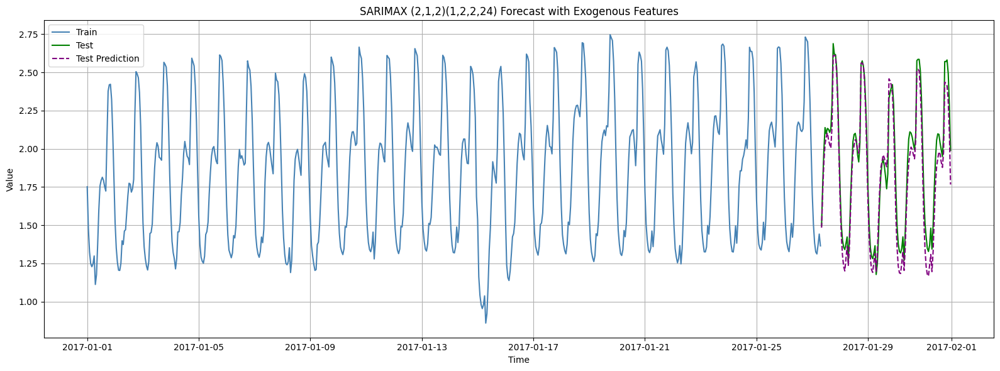

In [ ]:
# Fit SARIMAX with exogenous variables on the full training set
SARIMAX_model = SARIMAX(
    y_train,
    exog=X_train,
    order=(2, 1, 2),
    seasonal_order=(1, 2, 2, 24),
    enforce_stationarity=False,
    enforce_invertibility=False
).fit(disp=False)

# Forecast on the test set using exogenous variables
test_forecast = SARIMAX_model.get_forecast(steps=len(X_test), exog=X_test)
test_pred = test_forecast.predicted_mean.values

# Evaluate
test_rmse = np.sqrt(mean_squared_error(y_test, test_pred))
test_mape = mean_absolute_percentage_error(y_test, test_pred) * 100
test_r2 = r2_score(y_test, test_pred)

print(f"\nTest Metrics with exogenous Features:")
print(f"  RMSE: {test_rmse:.2f}")
print(f"  MAPE: {test_mape:.2f}%")
print(f"  R²: {test_r2:.4f}")

# Convert to series for plotting
test_pred_series = pd.Series(test_pred, index=y_test.index)

# Plot results
plt.figure(figsize=(16, 6))
plt.plot(y_train, label='Train', color='steelblue')
plt.plot(y_test, label='Test', color='green')
plt.plot(test_pred_series, '--', label='Test Prediction', color='purple')

plt.title("SARIMAX (2,1,2)(1,2,2,24) Forecast with Exogenous Features")
plt.xlabel("Time")
plt.ylabel("Value")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


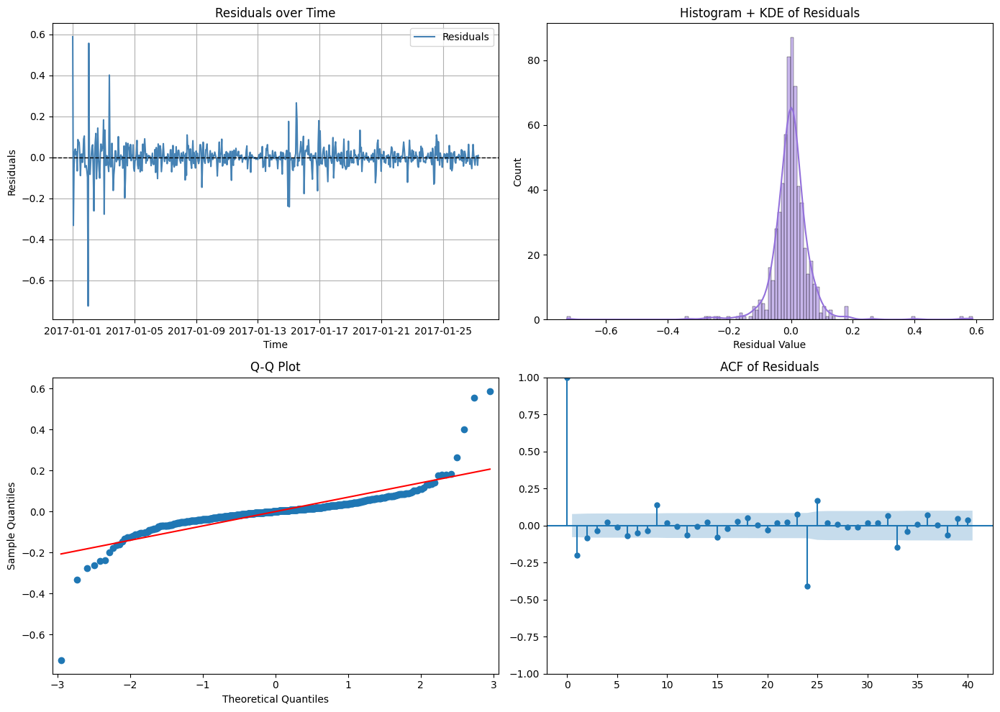

In [ ]:
residuals = SARIMAX_model.resid

# Create subplots
fig, axs = plt.subplots(2, 2, figsize=(14, 10))

# 1. Residuals over time
axs[0, 0].plot(residuals, label='Residuals', color='steelblue')
axs[0, 0].axhline(0, color='black', linestyle='--', linewidth=1)
axs[0, 0].set_title('Residuals over Time')
axs[0, 0].set_xlabel('Time')
axs[0, 0].set_ylabel('Residuals')
axs[0, 0].legend()
axs[0, 0].grid(True)

# 2. Histogram + KDE
sns.histplot(residuals, kde=True, ax=axs[0, 1], color='mediumpurple')
axs[0, 1].set_title('Histogram + KDE of Residuals')
axs[0, 1].set_xlabel('Residual Value')

# 3. Q-Q plot
sm.qqplot(residuals, line='s', ax=axs[1, 0])
axs[1, 0].set_title('Q-Q Plot')

# 4. ACF plot
plot_acf(residuals, ax=axs[1, 1], lags=40, alpha=0.05)
axs[1, 1].set_title('ACF of Residuals')

plt.tight_layout()
plt.show()


# LSTM and Vanilla RNN

In [ ]:
np.random.seed(0)
torch.manual_seed(0)

exog_features = final_df.drop(columns=["Zone1"]).values
target_series = final_df["Zone1"].values

def create_sequences(features, target, seq_length=10):
    X, y = [], []
    for i in range(len(features) - seq_length):
        X.append(features[i:i + seq_length])
        y.append(target[i + seq_length])
    return np.array(X), np.array(y)

seq_length = 48

X, y = create_sequences(exog_features, target_series, seq_length=seq_length)

train_size = int(0.85 * len(X))
X_train, Y_train = X[:train_size], y[:train_size]
X_test, Y_test = X[train_size:], y[train_size:]

X_train_tensor = torch.tensor(X_train, dtype=torch.float32)
Y_train_tensor = torch.tensor(Y_train, dtype=torch.float32).unsqueeze(-1)
X_test_tensor = torch.tensor(X_test, dtype=torch.float32)
Y_test_tensor = torch.tensor(Y_test, dtype=torch.float32).unsqueeze(-1)

batch_size = 32
train_dataset = torch.utils.data.TensorDataset(X_train_tensor, Y_train_tensor)
train_loader = torch.utils.data.DataLoader(train_dataset, batch_size=batch_size, shuffle=True)



In [ ]:

class SimpleRNN(nn.Module):
    def __init__(self, input_size, hidden_size=16, output_size=1):
        super(SimpleRNN, self).__init__()
        self.rnn = nn.RNN(input_size, hidden_size, batch_first=True)
        self.fc = nn.Linear(hidden_size, output_size)

    def forward(self, x):
        # x: (batch, seq_length, input_size)
        out, _ = self.rnn(x)
        # Use the last time step's output for prediction
        out = self.fc(out[:, -1, :])
        return out

# LSTM model definition
class LSTMModel(nn.Module):
    def __init__(self, input_size, hidden_size=16, output_size=1):
        super(LSTMModel, self).__init__()
        self.lstm = nn.LSTM(input_size, hidden_size, batch_first=True)
        self.fc = nn.Linear(hidden_size, output_size)

    def forward(self, x):
        # x: (batch, seq_length, input_size)
        out, _ = self.lstm(x)
        out = self.fc(out[:, -1, :])
        return out

# Input size equals the number of exogenous features.
input_size = X_train_tensor.shape[2]
rnn_model = SimpleRNN(input_size=input_size, hidden_size=16, output_size=1)
lstm_model = LSTMModel(input_size=input_size, hidden_size=16, output_size=1)

### 3. Training Setup

num_epochs = 500
learning_rate = 0.001
criterion = nn.MSELoss()
rnn_optimizer = optim.Adam(rnn_model.parameters(), lr=learning_rate)
lstm_optimizer = optim.Adam(lstm_model.parameters(), lr=learning_rate)

def train_model(model, optimizer, train_loader, num_epochs, model_name="Model"):
    model.train()
    losses = []
    for epoch in range(1, num_epochs + 1):
        epoch_losses = []
        for batch_x, batch_y in train_loader:
            optimizer.zero_grad()
            outputs = model(batch_x)
            loss = criterion(outputs, batch_y)
            loss.backward()
            optimizer.step()
            epoch_losses.append(loss.item())
        avg_loss = np.mean(epoch_losses)
        losses.append(avg_loss)
        if epoch % 100 == 0:
            print(f"{model_name} - Epoch [{epoch}/{num_epochs}], Loss: {avg_loss:.4f}")
    return losses

### 4. Training the Models

print("Training Simple RNN Model...")
rnn_losses = train_model(rnn_model, rnn_optimizer, train_loader, num_epochs, model_name="Simple RNN")

print("\nTraining LSTM Model...")
lstm_losses = train_model(lstm_model, lstm_optimizer, train_loader, num_epochs, model_name="LSTM")

### 5. Evaluation

def evaluate_model(model, X_test_tensor, Y_test):
    model.eval()
    with torch.no_grad():
        predictions = model(X_test_tensor).squeeze().cpu().numpy()
    rmse = np.sqrt(mean_squared_error(Y_test, predictions))
    mape = mean_absolute_percentage_error(Y_test, predictions)
    r2 = r2_score(Y_test, predictions)
    return rmse, mape, r2, predictions

print("\nEvaluating Simple RNN Model on Test Data...")
rnn_rmse, rnn_mape, rnn_r2, rnn_pred = evaluate_model(rnn_model, X_test_tensor, Y_test)
print(f"Simple RNN -> RMSE: {rnn_rmse:.4f}, MAPE: {rnn_mape:.4f}, R2 Score: {rnn_r2:.4f}")

print("\nEvaluating LSTM Model on Test Data...")
lstm_rmse, lstm_mape, lstm_r2, lstm_pred = evaluate_model(lstm_model, X_test_tensor, Y_test)
print(f"LSTM -> RMSE: {lstm_rmse:.4f}, MAPE: {lstm_mape:.4f}, R2 Score: {lstm_r2:.4f}")



Training Simple RNN Model...
Simple RNN - Epoch [100/500], Loss: 0.0238
Simple RNN - Epoch [200/500], Loss: 0.0206
Simple RNN - Epoch [300/500], Loss: 0.0179
Simple RNN - Epoch [400/500], Loss: 0.0165
Simple RNN - Epoch [500/500], Loss: 0.0162

Training LSTM Model...
LSTM - Epoch [100/500], Loss: 0.0142
LSTM - Epoch [200/500], Loss: 0.0107
LSTM - Epoch [300/500], Loss: 0.0090
LSTM - Epoch [400/500], Loss: 0.0081
LSTM - Epoch [500/500], Loss: 0.0078

Evaluating Simple RNN Model on Test Data...
Simple RNN -> RMSE: 0.1902, MAPE: 0.0862, R2 Score: 0.7218

Evaluating LSTM Model on Test Data...
LSTM -> RMSE: 0.1823, MAPE: 0.0748, R2 Score: 0.7447


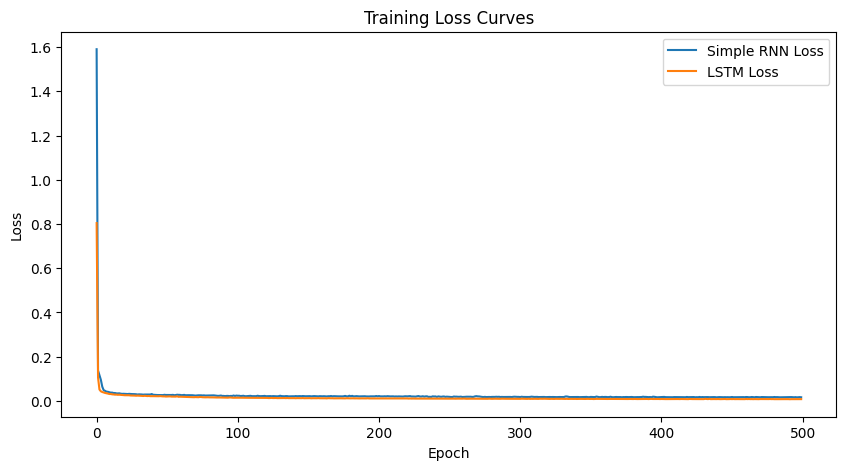

In [ ]:

plt.figure(figsize=(10, 5))
plt.plot(rnn_losses, label="Simple RNN Loss")
plt.plot(lstm_losses, label="LSTM Loss")
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.title("Training Loss Curves")
plt.legend()
plt.show()


# rough 2

In [ ]:
np.random.seed(0)
torch.manual_seed(0)

exog_features = final_df.drop(columns=["Zone1"]).values
target_series = final_df["Zone1"].values

def create_sequences(features, target, seq_length=48):
    X, y = [], []
    for i in range(len(features) - seq_length):
        X.append(features[i:i + seq_length])
        y.append(target[i + seq_length])
    return np.array(X), np.array(y)

seq_length = 48
X, y = create_sequences(exog_features, target_series, seq_length=seq_length)

train_size = int(0.85 * len(X))
X_train, Y_train = X[:train_size], y[:train_size]
X_test, Y_test = X[train_size:], y[train_size:]

X_train_tensor = torch.tensor(X_train, dtype=torch.float32)
Y_train_tensor = torch.tensor(Y_train, dtype=torch.float32).unsqueeze(-1)
X_test_tensor = torch.tensor(X_test, dtype=torch.float32)
Y_test_tensor = torch.tensor(Y_test, dtype=torch.float32).unsqueeze(-1)

batch_size = 64
train_dataset = torch.utils.data.TensorDataset(X_train_tensor, Y_train_tensor)
train_loader = torch.utils.data.DataLoader(train_dataset, batch_size=batch_size, shuffle=True)

In [ ]:
# RNN model
class SimpleRNN(nn.Module):
    def __init__(self, input_size, hidden_size=32, output_size=1):
        super(SimpleRNN, self).__init__()
        self.rnn = nn.RNN(input_size, hidden_size, batch_first=True)
        self.fc = nn.Linear(hidden_size, output_size)

    def forward(self, x):
        out, _ = self.rnn(x)
        return self.fc(out[:, -1, :])

input_size = X_train_tensor.shape[2]
rnn_model = SimpleRNN(input_size=input_size)

# Training setup
criterion = nn.MSELoss()
rnn_optimizer = optim.Adam(rnn_model.parameters(), lr=0.001)

def train_model(model, optimizer, train_loader, num_epochs=500, model_name="Model"):
    model.train()
    losses = []
    for epoch in range(1, num_epochs + 1):
        epoch_losses = []
        for batch_x, batch_y in train_loader:
            optimizer.zero_grad()
            outputs = model(batch_x)
            loss = criterion(outputs, batch_y)
            loss.backward()
            optimizer.step()
            epoch_losses.append(loss.item())
        avg_loss = np.mean(epoch_losses)
        losses.append(avg_loss)
        if epoch % 100 == 0:
            print(f"{model_name} - Epoch [{epoch}/500], Loss: {avg_loss:.4f}")
    return losses

print("Training Simple RNN...")
rnn_losses = train_model(rnn_model, rnn_optimizer, train_loader, num_epochs=500, model_name="Simple RNN")

def evaluate_model(model, X_test_tensor, Y_test):
    model.eval()
    with torch.no_grad():
        predictions = model(X_test_tensor).squeeze().cpu().numpy()
    rmse = np.sqrt(mean_squared_error(Y_test, predictions))
    mape = mean_absolute_percentage_error(Y_test, predictions)
    r2 = r2_score(Y_test, predictions)
    return rmse, mape, r2, predictions

print("Evaluating RNN...")
rnn_rmse, rnn_mape, rnn_r2, rnn_pred = evaluate_model(rnn_model, X_test_tensor, Y_test)
print(f"RNN -> RMSE: {rnn_rmse:.4f}, MAPE: {rnn_mape:.4f}, R2 Score: {rnn_r2:.4f}")


Training Simple RNN...
Simple RNN - Epoch [100/500], Loss: 0.0173
Simple RNN - Epoch [200/500], Loss: 0.0150
Simple RNN - Epoch [300/500], Loss: 0.0148
Simple RNN - Epoch [400/500], Loss: 0.0144
Simple RNN - Epoch [500/500], Loss: 0.0132
Evaluating RNN...
RNN -> RMSE: 0.1626, MAPE: 0.0698, R2 Score: 0.7968


In [ ]:
class LSTMModel(nn.Module):
    def __init__(self, input_size, hidden_size=32, output_size=1):
        super(LSTMModel, self).__init__()
        self.lstm = nn.LSTM(input_size, hidden_size, batch_first=True)
        self.fc = nn.Linear(hidden_size, output_size)

    def forward(self, x):
        out, _ = self.lstm(x)
        return self.fc(out[:, -1, :])

lstm_model = LSTMModel(input_size=input_size)
lstm_optimizer = optim.Adam(lstm_model.parameters(), lr=0.001)

print("Training LSTM...")
lstm_losses = train_model(lstm_model, lstm_optimizer, train_loader, num_epochs=500, model_name="LSTM")

print("Evaluating LSTM...")
lstm_rmse, lstm_mape, lstm_r2, lstm_pred = evaluate_model(lstm_model, X_test_tensor, Y_test)
print(f"LSTM -> RMSE: {lstm_rmse:.4f}, MAPE: {lstm_mape:.4f}, R2 Score: {lstm_r2:.4f}")


Training LSTM...
LSTM - Epoch [100/500], Loss: 0.0089
LSTM - Epoch [200/500], Loss: 0.0063
LSTM - Epoch [300/500], Loss: 0.0046
LSTM - Epoch [400/500], Loss: 0.0039
LSTM - Epoch [500/500], Loss: 0.0037
Evaluating LSTM...
LSTM -> RMSE: 0.1409, MAPE: 0.0693, R2 Score: 0.8474


In [ ]:
hidden_sizes = [16, 32]
learning_rates = [0.01, 0.001]
batch_sizes = [32, 64]

best_rmse = float('inf')
best_config = None
best_model = None

for hidden_size, lr, batch_size in itertools.product(hidden_sizes, learning_rates, batch_sizes):
    print(f"\nTraining with hidden_size={hidden_size}, lr={lr}, batch_size={batch_size}")

    train_dataset = torch.utils.data.TensorDataset(X_train_tensor, Y_train_tensor)
    train_loader = torch.utils.data.DataLoader(train_dataset, batch_size=batch_size, shuffle=True)

    model = SimpleRNN(input_size=input_size, hidden_size=hidden_size)
    optimizer = torch.optim.Adam(model.parameters(), lr=lr)

    train_model(model, optimizer, train_loader, num_epochs=100, model_name="Tuned RNN")

    rmse, mape, r2, _ = evaluate_model(model, X_test_tensor, Y_test)
    print(f"Evaluation -> RMSE: {rmse:.4f}, MAPE: {mape:.4f}, R2: {r2:.4f}")

    if rmse < best_rmse:
        best_rmse = rmse
        best_config = (hidden_size, lr, batch_size)
        best_model = model

print("\nBest Config:")
print(f"Hidden Size: {best_config[0]}, Learning Rate: {best_config[1]}, Batch Size: {best_config[2]}")
print(f"Best RMSE: {best_rmse:.4f}")


Training with hidden_size=16, lr=0.01, batch_size=32


KeyboardInterrupt: 

# Rough work

In [ ]:
import numpy as np
import pandas as pd
import torch
import torch.nn as nn
import torch.optim as optim
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.model_selection import TimeSeriesSplit
from sklearn.metrics import mean_squared_error, mean_absolute_percentage_error, r2_score


In [ ]:
np.random.seed(0)
torch.manual_seed(0)


exog_features = final_df.drop(columns=["Zone1"]).values
target_series = final_df["Zone1"].values

def create_sequences(features, target, seq_length=10):
    X, y = [], []
    for i in range(len(features) - seq_length):
        X.append(features[i:i + seq_length])
        y.append(target[i + seq_length])
    return np.array(X), np.array(y)

seq_length = 48
X_all, y_all = create_sequences(exog_features, target_series, seq_length=seq_length)


In [ ]:
class SimpleRNN(nn.Module):
    def __init__(self, input_size, hidden_size=16, output_size=1):
        super(SimpleRNN, self).__init__()
        self.rnn = nn.RNN(input_size, hidden_size, batch_first=True)
        self.fc = nn.Linear(hidden_size, output_size)

    def forward(self, x):
        out, _ = self.rnn(x)
        out = self.fc(out[:, -1, :])
        return out

class LSTMModel(nn.Module):
    def __init__(self, input_size, hidden_size=16, output_size=1):
        super(LSTMModel, self).__init__()
        self.lstm = nn.LSTM(input_size, hidden_size, batch_first=True)
        self.fc = nn.Linear(hidden_size, output_size)

    def forward(self, x):
        out, _ = self.lstm(x)
        out = self.fc(out[:, -1, :])
        return out


In [ ]:
def train_one_epoch(model, optimizer, criterion, train_loader):
    model.train()
    epoch_loss = 0
    for batch_x, batch_y in train_loader:
        optimizer.zero_grad()
        outputs = model(batch_x)
        loss = criterion(outputs, batch_y)
        loss.backward()
        optimizer.step()
        epoch_loss += loss.item()
    return epoch_loss / len(train_loader)

def evaluate_model(model, X_test_tensor, Y_test_tensor):
    model.eval()
    with torch.no_grad():
        predictions = model(X_test_tensor).squeeze().cpu().numpy()
    y_true = Y_test_tensor.squeeze().cpu().numpy()
    rmse = np.sqrt(mean_squared_error(y_true, predictions))
    mape = mean_absolute_percentage_error(y_true, predictions)
    r2 = r2_score(y_true, predictions)
    return rmse, mape, r2, predictions


In [ ]:
input_size = X_all.shape[2]
output_size = 1

hidden_sizes = [16, 32]
learning_rates = [0.01, 0.005]
batch_sizes = [32, 64]
num_epochs = 1000

tscv = TimeSeriesSplit(n_splits=3)

best_config = None
best_rmse = np.inf

for hidden_size in hidden_sizes:
    for lr in learning_rates:
        for batch_size in batch_sizes:
            print(f"\nTrying hidden_size={hidden_size}, lr={lr}, batch_size={batch_size}")
            rmses = []

            for fold, (train_idx, val_idx) in enumerate(tscv.split(X_all)):
                X_train_fold = torch.tensor(X_all[train_idx], dtype=torch.float32)
                Y_train_fold = torch.tensor(y_all[train_idx], dtype=torch.float32).unsqueeze(-1)
                X_val_fold = torch.tensor(X_all[val_idx], dtype=torch.float32)
                Y_val_fold = torch.tensor(y_all[val_idx], dtype=torch.float32).unsqueeze(-1)

                train_dataset = torch.utils.data.TensorDataset(X_train_fold, Y_train_fold)
                train_loader = torch.utils.data.DataLoader(train_dataset, batch_size=batch_size, shuffle=False)

                model = LSTMModel(input_size=input_size, hidden_size=hidden_size, output_size=output_size)
                optimizer = optim.Adam(model.parameters(), lr=lr)
                criterion = nn.MSELoss()

                for epoch in range(num_epochs):
                    train_loss = train_one_epoch(model, optimizer, criterion, train_loader)

                rmse, _, _, _ = evaluate_model(model, X_val_fold, Y_val_fold)
                rmses.append(rmse)

            avg_rmse = np.mean(rmses)
            print(f"Average RMSE: {avg_rmse:.4f}")

            if avg_rmse < best_rmse:
                best_rmse = avg_rmse
                best_config = (hidden_size, lr, batch_size)

print(f"\n Best Config: hidden_size={best_config[0]}, lr={best_config[1]}, batch_size={best_config[2]} (RMSE={best_rmse:.4f})")



Trying hidden_size=16, lr=0.01, batch_size=32
Average RMSE: 0.3172

Trying hidden_size=16, lr=0.01, batch_size=64
Average RMSE: 0.2659

Trying hidden_size=16, lr=0.005, batch_size=32
Average RMSE: 0.2533

Trying hidden_size=16, lr=0.005, batch_size=64
Average RMSE: 0.2373

Trying hidden_size=32, lr=0.01, batch_size=32
Average RMSE: 0.3038

Trying hidden_size=32, lr=0.01, batch_size=64
Average RMSE: 0.2823

Trying hidden_size=32, lr=0.005, batch_size=32
Average RMSE: 0.2974

Trying hidden_size=32, lr=0.005, batch_size=64
Average RMSE: 0.2569

✅ Best Config: hidden_size=16, lr=0.005, batch_size=64 (RMSE=0.2373)


In [ ]:
hidden_size = 16
learning_rate = 0.005
batch_size = 64
num_epochs = 1000

# ==== TimeSeriesSplit ====
tscv = TimeSeriesSplit(n_splits=3, test_size=int(0.2 * len(X_all)))

# ==== Store fold metrics ====
rmse_list, mape_list, r2_list = [], [], []

for fold, (train_index, val_index) in enumerate(tscv.split(X_all)):
    print(f"\nFold {fold + 1}:")

    X_train, X_val = X_all[train_index], X_all[val_index]
    y_train, y_val = y_all[train_index], y_all[val_index]

    # Convert to tensors
    X_train_tensor = torch.tensor(X_train, dtype=torch.float32)
    y_train_tensor = torch.tensor(y_train, dtype=torch.float32).unsqueeze(-1)
    X_val_tensor = torch.tensor(X_val, dtype=torch.float32)
    y_val_tensor = torch.tensor(y_val, dtype=torch.float32).unsqueeze(-1)

    # Dataloader
    train_dataset = torch.utils.data.TensorDataset(X_train_tensor, y_train_tensor)
    train_loader = torch.utils.data.DataLoader(train_dataset, batch_size=batch_size, shuffle=False)

    # Model, optimizer, loss
    model = LSTMModel(input_size=X_all.shape[2], hidden_size=hidden_size, output_size=1)
    optimizer = optim.Adam(model.parameters(), lr=learning_rate)
    criterion = nn.MSELoss()

    # Training loop
    for epoch in range(num_epochs):
        model.train()
        for batch_X, batch_y in train_loader:
            optimizer.zero_grad()
            output = model(batch_X)
            loss = criterion(output, batch_y)
            loss.backward()
            optimizer.step()

    # Evaluation on validation
    model.eval()
    with torch.no_grad():
        preds = model(X_val_tensor).squeeze().numpy()
        actuals = y_val_tensor.squeeze().numpy()

    # Metrics
    rmse = np.sqrt(mean_squared_error(actuals, preds))
    mape = mean_absolute_percentage_error(actuals, preds)
    r2 = r2_score(actuals, preds)

    print(f"RMSE: {rmse:.4f} | MAPE: {mape*100:.2f}% | R2: {r2:.4f}")

    rmse_list.append(rmse)
    mape_list.append(mape)
    r2_list.append(r2)




Fold 1:


KeyboardInterrupt: 

In [ ]:
test_split_index = int(0.85 * len(X_all))
X_train_final, y_train_final = X_all[:test_split_index], y_all[:test_split_index]
X_test, y_test = X_all[test_split_index:], y_all[test_split_index:]

X_train_tensor = torch.tensor(X_train_final, dtype=torch.float32)
y_train_tensor = torch.tensor(y_train_final, dtype=torch.float32).unsqueeze(-1)
X_test_tensor = torch.tensor(X_test, dtype=torch.float32)
y_test_tensor = torch.tensor(y_test, dtype=torch.float32).unsqueeze(-1)

train_dataset = torch.utils.data.TensorDataset(X_train_tensor, y_train_tensor)
train_loader = torch.utils.data.DataLoader(train_dataset, batch_size=batch_size, shuffle=False)

model = LSTMModel(input_size=X_all.shape[2], hidden_size=hidden_size, output_size=1)
optimizer = optim.Adam(model.parameters(), lr=learning_rate)
criterion = nn.MSELoss()

for epoch in range(num_epochs):
    model.train()
    for batch_X, batch_y in train_loader:
        optimizer.zero_grad()
        output = model(batch_X)
        loss = criterion(output, batch_y)
        loss.backward()
        optimizer.step()

model.eval()
with torch.no_grad():
    test_preds = model(X_test_tensor).squeeze().numpy()
    test_actuals = y_test_tensor.squeeze().numpy()

test_rmse = np.sqrt(mean_squared_error(test_actuals, test_preds))
test_mape = mean_absolute_percentage_error(test_actuals, test_preds)
test_r2 = r2_score(test_actuals, test_preds)

print("\n==== Cross-Validation Averages ====")
print(f"Avg RMSE: {np.mean(rmse_list):.4f}")
print(f"Avg MAPE: {np.mean(mape_list)*100:.2f}%")
print(f"Avg R2: {np.mean(r2_list):.4f}")

print("\n==== Final Test Set Metrics ====")
print(f"RMSE: {test_rmse:.4f}")
print(f"MAPE: {test_mape*100:.2f}%")
print(f"R2: {test_r2:.4f}")

# GRU

In [ ]:
import numpy as np
import torch
import torch.nn as nn
import torch.optim as optim
from sklearn.metrics import mean_squared_error, mean_absolute_percentage_error, r2_score
import matplotlib.pyplot as plt

# Reproducibility
np.random.seed(0)
torch.manual_seed(0)

# === 1. Data Prep ===
# Target: Zone1
# Features: all except Zone1
target_series = final_df["Zone1"].values / 1e5  # scale Zone1
exog_features = final_df.drop(columns=["Zone1"]).values

# Create sequences
def create_sequences(features, target, seq_length=10):
    X, y = [], []
    for i in range(len(features) - seq_length):
        X.append(features[i:i + seq_length])
        y.append(target[i + seq_length])
    return np.array(X), np.array(y)

seq_length = 10
X, y = create_sequences(exog_features, target_series, seq_length)

# Train/Test split
train_size = int(0.8 * len(X))
X_train, Y_train = X[:train_size], y[:train_size]
X_test, Y_test = X[train_size:], y[train_size:]


In [ ]:

# Torch tensors
X_train_tensor = torch.tensor(X_train, dtype=torch.float32)
Y_train_tensor = torch.tensor(Y_train, dtype=torch.float32).unsqueeze(-1)
X_test_tensor = torch.tensor(X_test, dtype=torch.float32)
Y_test_tensor = torch.tensor(Y_test, dtype=torch.float32).unsqueeze(-1)

train_dataset = torch.utils.data.TensorDataset(X_train_tensor, Y_train_tensor)
train_loader = torch.utils.data.DataLoader(train_dataset, batch_size=32, shuffle=True)

# === 2. GRU Model ===
class GRUNet(nn.Module):
    def __init__(self, input_dim, hidden_dim=64):
        super(GRUNet, self).__init__()
        self.gru = nn.GRU(input_dim, hidden_dim, batch_first=True)
        self.fc = nn.Linear(hidden_dim, 1)

    def forward(self, x):
        out, _ = self.gru(x)
        return self.fc(out[:, -1, :])  # Last timestep output

input_dim = X_train.shape[2]
model = GRUNet(input_dim)
criterion = nn.MSELoss()
optimizer = optim.Adam(model.parameters(), lr=0.001)

# === 3. Training ===
n_epochs = 500
losses = []

for epoch in range(n_epochs):
    model.train()
    total_loss = 0
    for batch_x, batch_y in train_loader:
        optimizer.zero_grad()
        out = model(batch_x)
        loss = criterion(out, batch_y)
        loss.backward()
        optimizer.step()
        total_loss += loss.item() * batch_x.size(0)
    avg_loss = total_loss / len(train_loader.dataset)
    losses.append(avg_loss)

    # Print every 100 epochs
    if (epoch + 1) % 100 == 0:
        print(f"GRU - Epoch [{epoch+1}/{n_epochs}], Loss: {avg_loss:.4f}")

# === 4. Evaluation ===
model.eval()
with torch.no_grad():
    y_pred = model(X_test_tensor).squeeze().numpy()
    y_true = Y_test_tensor.squeeze().numpy()



In [ ]:
y_pred /= 1e3
y_true /= 1e3

rmse = np.sqrt(mean_squared_error(y_true, y_pred))
mse = mean_squared_error(y_true, y_pred)
mape = mean_absolute_percentage_error(y_true, y_pred)
r2 = r2_score(y_true, y_pred)

print(f"\n✅ RMSE: {rmse:.2f}")
print(f"✅ MSE : {mse:.2f}")
print(f"✅ MAPE: {mape * 100:.2f}%")
print(f"✅ R²  : {r2:.4f}")

# === 5. Plot Loss ===
plt.plot(losses)
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.title("GRU Training Loss over 500 Epochs")
plt.grid(True)
plt.show()
